# **Development of AstroCLIP**

<div class="alert alert-block alert-info">
<b>Preamble:</b> In fulfiment of Part II of the project, we develop AstroCLIP: a self-supervised neural network model that can embed both APOGEE and JWST data into a shared, physically meaningful latent space. These embeddings can then be used - without any model fine-tuning - for a variety of downstream tasks including (1) accurate in-modality and cross-modality semantic similarity search, (2) galaxy property estimation from both images and spectra and (3) t-SNE, uMAP, PCA analysis. We also apply one-shot regression on the latent space.
</div>

## Table of contents<font><a class='anchor' id='top'></a>
* ### [0. Set Up](#set-up) ###
* ### [1. Process Data](#process-data) ###
  * #### [1.1. Load Data](#load-data) ####
  * #### [1.2. Prepare Data](#prep-data) ####
  * #### [1.3. Emulate Real Data](#emul-real) #### 
  * #### [1.4. Partition Data](#partition-data) ####
* ### [2. Build Model](#build-model) ###
  * #### [2.1. Set up](#set-up-model) ####
  * #### [2.2. Create Embedders](#create-embedders) ####
  * #### [2.3. Create CLIP](#create-CLIP) ####
* ### [3. Train Model](#train-model) ###
  * #### [3.1. Set up](#set-up-train) ####
  * #### [3.2. Run training](#run-train) ####
* ### [4. Test Model](#test-model) ###
* ### [5. Implement Mock Model](#mock-model) ###
  * #### [5.1. Build Mock Model](#build-mock) ####
  * #### [5.2. Train Mock Model](#train-mock) ####
  * #### [5.3. Test Mock Model](#test-mock) ####
* ### [6. Implement Downstream Tasks](#downstream-tasks) ###
  * #### [6.1. Test Neighbourhood Retrieval](#css) ####
  * #### [6.2. Fill Embedding Space](#fill-embed) ####
  * #### [6.3. One-Shot Learning](#one-shot) ####
  * #### [6.4. Zero-shot k-NN](#zero-shot-knn) ###
  * #### [6.5. Latent Space Visualisation](#lat-space) ####
* ### [7. Appendix](#appendix) ###
* ### [8. References](#refs) ###
* ### [9. Misc. Code](#misc-code) ### 

## **0. Set Up** <a class="anchor" id="set-up"></a>
We load all packages, set the parameters for plotting and define the seeding function. 

In [137]:
## Import packages ##
# Standard library
import os
import random
import time
import warnings
from collections import Counter, defaultdict
from pathlib import Path

# Numerical and data analysis
import numpy as np
import pandas as pd

# Visualization
import itertools
import matplotlib.pyplot as plt
import seaborn as sns
from IPython.display import display
from matplotlib.colors import Normalize
from matplotlib.ticker import MaxNLocator
from matplotlib import gridspec
from matplotlib.widgets import Slider
from mpl_toolkits.mplot3d import Axes3D

# Signal processing and astronomy
import cv2
import scipy.stats as stats
from scipy.ndimage import gaussian_filter1d
from scipy.signal import convolve, fftconvolve
from scipy.special import erf
from astropy import constants, units
from astropy.io import fits

# Machine learning and data processing
import umap
from sklearn.decomposition import PCA
from sklearn.ensemble import AdaBoostRegressor, RandomForestRegressor
from sklearn.linear_model import Lasso, ElasticNetCV, LinearRegression, Ridge, LassoCV, MultiTaskLasso, MultiTaskLassoCV, MultiTaskElasticNetCV
from sklearn.multioutput import MultiOutputRegressor 
from sklearn.manifold import TSNE
from sklearn.metrics import mean_absolute_error, mean_squared_error, r2_score
from sklearn.metrics.pairwise import cosine_similarity
from sklearn.model_selection import GridSearchCV, train_test_split, cross_val_score
from sklearn.neighbors import KNeighborsRegressor
from sklearn.preprocessing import PolynomialFeatures, StandardScaler
from sklearn.tree import DecisionTreeRegressor

# PyTorch and Lightning
import torch
import torch.nn as nn
import torch.nn.functional as F
import torch.optim.lr_scheduler as lr_scheduler 
import torch.autograd as autograd
from torch.utils.data import (ConcatDataset, DataLoader, Dataset, RandomSampler, 
                              Subset, TensorDataset)
from torchsummary import summary
import lightning as L
from lightning.pytorch.callbacks import ModelCheckpoint
from pytorch_lightning.loggers import TensorBoardLogger

# HDF5 and progress bar
import h5py
from tqdm import tqdm

In [2]:
## Set parameters for plotting ## 
plt.rcParams.update({
    'axes.facecolor': 'white',
    'axes.grid': True,
    'grid.color': 'gray',
    'grid.alpha': 0.4,
    'text.usetex': True,
    'font.family': 'serif'
})

# Set color map
cmap = sns.cubehelix_palette(8, start=2.8, rot=0.1, dark=0, light=0.95, as_cmap=True)

# Set label names
label_names = [
    r'$T_{\mathrm{eff}}$', r'$\log(g)$', r'$C$', r'$N$', r'$O$', r'$Na$', r'$Mg$', r'$Al$', r'$Si$', 
    r'$S$', r'$K$', r'$Ca$', r'$Ti$', r'$V$', r'$Cr$', r'$Mn$', r'$Fe$', r'$Co$', r'$Ni$', r'$Ce$'
]

In [3]:
## Set up seed for reproducibility ## 
def set_seed(seed):
    torch.manual_seed(seed)
    torch.cuda.manual_seed(seed)
    torch.backends.cudnn.deterministic = True
    torch.backends.cudnn.benchmark = False
    L.seed_everything(seed) 
    np.random.seed(seed) 

set_seed(42)

Seed set to 42


## **1. Process Data** <a class="anchor" id="process-data"></a>

### **1.1. Load Data** <a class="anchor" id="load-data"></a>

In [4]:
## Define directories ## 
DATA_DIR = Path('/yngve_data/')
LOCAL_DATA_DIR = Path('/geir_data/scr/sandford')

In [5]:
## Load in JWST files ## 
jwst_spec_file = LOCAL_DATA_DIR / 'JWST_APOGEE.h5'
jwst_wave = pd.read_hdf(jwst_spec_file, 'wavelength').iloc[0].values
jwst_labels = pd.read_hdf(jwst_spec_file, 'labels')
jwst_spectra = pd.read_hdf(jwst_spec_file, 'spectra')

In [6]:
## Load in APOGEE files ## 
apogee_spec_file = LOCAL_DATA_DIR / 'apogee_dr17.h5'
apogee_dr17_dir = DATA_DIR / 'sdss/apogee/dr17/apogee/spectro/aspcap/dr17/synspec'

_LOG10LAMBDA0 = 4.179
_DLOG10LAMBDA = 6. * 10.**-6.
_NLAMBDA = 8575
apogee_wave = 10.**np.arange(
    _LOG10LAMBDA0,
    _LOG10LAMBDA0 +_NLAMBDA * _DLOG10LAMBDA,
    _DLOG10LAMBDA
)
apogee_labels = pd.read_hdf(apogee_spec_file, 'allstar')
apogee_spectra = pd.read_pickle(os.path.join('DATA', 'apogee_spectra.pkl')) 

### **1.2. Prepare Data** <a class="anchor" id="prep-data"></a>

In [7]:
## Convert JWST row names from stellar tags to indices ## 
jwst_spectra.reset_index(drop = True, inplace = True)
jwst_labels.reset_index(drop = True, inplace = True) 

print(jwst_labels.index) # preview 

RangeIndex(start=0, stop=19799, step=1)


In [8]:
## Drop missing data point in APOGEE data with no JWST pair ## 
apogee_labels.drop(index = 11215, inplace = True)
apogee_labels.reset_index(drop = True, inplace = True)

print(apogee_labels.index)
print(f"Shapes of JWST and APOGEE labels before dropping duplicates: {jwst_labels.shape}, {apogee_labels.shape}")

## Drop all duplicates in APOGEE and JWST data ## 
duplicate_indices = apogee_labels[apogee_labels.duplicated(subset = 'APOGEE_ID', keep = 'first')].index
apogee_labels.drop(index = duplicate_indices, inplace = True)
jwst_spectra.drop(index = duplicate_indices, inplace = True) 
jwst_labels.drop(index = duplicate_indices, inplace = True)

apogee_labels.reset_index(drop = True, inplace = True)
jwst_spectra.reset_index(drop = True, inplace = True) 
jwst_labels.reset_index(drop = True, inplace = True)

print(f"Shapes of JWST and APOGEE labels after dropping duplicates: {jwst_labels.shape}, {apogee_labels.shape}")

RangeIndex(start=0, stop=19799, step=1)
Shapes of JWST and APOGEE labels before dropping duplicates: (19799, 20), (19799, 55)
Shapes of JWST and APOGEE labels after dropping duplicates: (19001, 20), (19001, 55)


In [9]:
## Make noisy JWST data using saved APOGEE SNR  ## 
noise_to_signal = np.array((apogee_labels["SNR"])**(-1)) 
noise_to_signal = noise_to_signal[:, np.newaxis] 
noise_to_signal = np.tile(noise_to_signal, (1, 8192))
jwst_spectra_noisy = jwst_spectra + np.random.normal(0, 10*jwst_spectra.values*noise_to_signal) 

## Drop unneeded APOGEE labels ## 
apogee_labels = apogee_labels.rename(columns=lambda x: x.replace('_FE', '').capitalize())
apogee_labels = apogee_labels.iloc[:, 9:]  # drop first nine columns
apogee_labels = apogee_labels.loc[:, ~apogee_labels.columns.str.endswith('err')]
apogee_labels = apogee_labels.rename(columns=lambda x: x.replace('Logg', 'logg'))
apogee_labels = apogee_labels.drop(columns=["M_h", "Alpha_m", "Vmicro", "Vmacro"])
apogee_labels = apogee_labels.rename(columns=lambda x: x.replace('_h', ''))

In [10]:
## Convert APOGEE metallicities [X/Fe] to JWST metallicities [X/H] ## 
# Note: [X/Fe] + [Fe/H] = [X/H].
Fe_H = apogee_labels["Fe"]
for i in range(2, len(apogee_labels.columns)):
    if i != apogee_labels.columns.get_loc('Fe'): # Fe column is already of the form [Fe/H] 
        apogee_labels.iloc[:, i] += Fe_H

## Check! ## 
all(jwst_labels == apogee_labels) == True

True

In [11]:
## Determine ranges of stellar labels ## 
stellar_label_df = pd.DataFrame({'Min': jwst_labels.min(), 'Max': jwst_labels.max(), 'Range': jwst_labels.max() - jwst_labels.min(), 'Std': jwst_labels.std()})
stellar_label_df.round(3)

,Min,Max,Range,Std
Teff,4001.962,4953.215,951.253,150.908
logg,0.737,2.000,1.263,0.244
C,-2.570,0.539,3.109,0.389
N,-1.489,0.799,2.288,0.330
O,-1.749,0.518,2.267,0.266
Na,-2.208,0.762,2.969,0.374
Mg,-1.813,0.523,2.336,0.273
Al,-2.180,0.443,2.623,0.315
Si,-1.587,0.459,2.045,0.265
S,-1.649,0.839,2.488,0.236


### **1.3. Emulate Real Data** <a class="anchor" id="emul-real"></a>

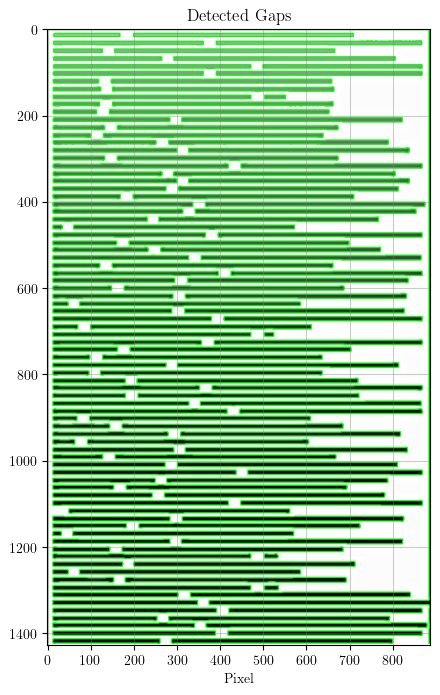

In [12]:
## Identify gaps in real data ## 
# Load the image
image_path = os.path.join("FIGURES", "Sample_Real_Data.png")
image = cv2.imread(image_path)

# Convert to grayscale
gray_image = cv2.cvtColor(image, cv2.COLOR_BGR2GRAY)

# Apply binary thresholding to distinguish the gaps
_, binary_image = cv2.threshold(gray_image, 200, 255, cv2.THRESH_BINARY_INV)

# Find contours, which correspond to the gaps
contours, _ = cv2.findContours(binary_image, cv2.RETR_EXTERNAL, cv2.CHAIN_APPROX_SIMPLE)

# Draw contours on the original image (for visualization)
contour_image = image.copy()
cv2.drawContours(contour_image, contours, -1, (0, 255, 0), 2)

# Initialize a dictionary to store gaps grouped by y-coordinate
blocks_by_y = defaultdict(list)

# Measure the bounding box of each contour and group by y-coordinate
for contour in contours:
    x, y, w, h = cv2.boundingRect(contour)
    if y != 0:
        blocks_by_y[y].append((x, w))

# Initialize lists to store (x, w) of gaps
x_gaps1 = []; x_gaps2 = []; w_gaps1 = []; w_gaps2 = []

# Process grouped gaps
for y_coord, blocks in blocks_by_y.items():
    if len(blocks) == 2:
        # Sort blocks by x-coordinate
        blocks.sort(key=lambda block: block[0])
        
        # Calculate x and width of first and second gaps
        x_gap1 = blocks[0][0] + blocks[0][1]
        w_gap1 = blocks[1][0] - x_gap1
        x_gap2 = blocks[1][0] + blocks[1][1]
        w_gap2 = 888 - x_gap2
        
        # Append results to the lists
        x_gaps1.append(x_gap1)
        x_gaps2.append(x_gap2)
        w_gaps1.append(w_gap1)
        w_gaps2.append(w_gap2)

# Convert pixel values to wavelength scale (in micrometers)
conversion_factor = (1.8 - 0.95)*10**4 / 888
x_gaps1 = [x * conversion_factor + 0.95*10**4 for x in x_gaps1]
w_gaps1 = [w * conversion_factor for w in w_gaps1]
w_gaps2 = [w * conversion_factor for w in w_gaps2]

# Display the original image with contours
plt.figure(figsize=(10, 8))
plt.imshow(cv2.cvtColor(contour_image, cv2.COLOR_BGR2RGB))
plt.title("Detected Gaps")
plt.xlabel("Pixel") 
plt.show()

In [13]:
## Apply KDE to identified gaps ##
kde_x_gaps1 = stats.gaussian_kde(x_gaps1)
kde_w_gaps1 = stats.gaussian_kde(w_gaps1)
kde_w_gaps2 = stats.gaussian_kde(w_gaps2) 

## Generate new gaps from KDE ##
def resample_non_negative(kde, size):
    """Resample from KDE and ensure all values are non-negative.
    """
    samples = kde.resample(size) 
    samples = np.maximum(samples, 0)
    return samples.squeeze()

n_1 = 1000; n_2 = jwst_spectra.shape[0] - n_1
new_x_gaps1_1 = resample_non_negative(kde_x_gaps1, n_1); new_x_gaps1_2 = resample_non_negative(kde_x_gaps1, n_2) 
new_w_gaps1_1 = resample_non_negative(kde_w_gaps1, n_1); new_w_gaps1_2 = resample_non_negative(kde_w_gaps1, n_2) 
new_w_gaps2_1 = resample_non_negative(kde_w_gaps2, n_1); new_w_gaps2_2 = resample_non_negative(kde_w_gaps2, n_2) 

## Visualise a sample of the gaps created ## 
#plt.figure(figsize = (4, 8))
#for i in range(100): 
   #x = np.linspace(0.97*10**4, 1.8*10**4, 100)
   #y = np.ones_like(x) + i
   #plt.plot(x, y, 'k-', linewidth = 2)

   #plt.plot([new_x_gaps1[i], new_x_gaps1[i] + new_w_gaps1[i]], [y[0], y[0]], 'w-', linewidth=3)
   #plt.plot([1.8*10**4-new_w_gaps2[i], 1.8*10**4], [y[0], y[0]], 'w-', linewidth=3)
   #plt.xlim([0.95*10**4, 1.8*10**4])
   #plt.tick_params(left = False) 
   #plt.yticks([])
   #plt.xlabel("Wavelength")
   #plt.title("100 Samples of Generated Gaps") 

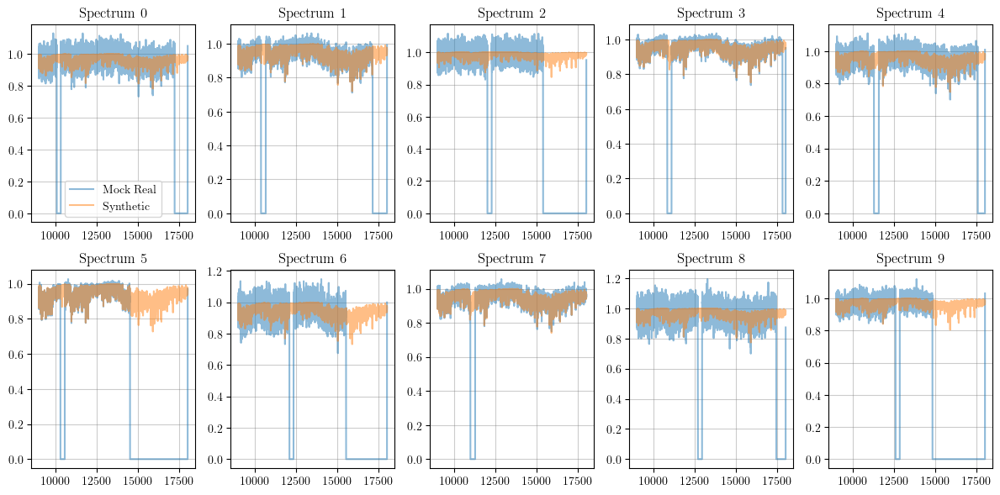

In [14]:
## Prepare mock data ##
random_sample_idx = np.random.choice(jwst_spectra.index, size=n_1, replace=False) 
random_sample_idx_c = np.setdiff1d(jwst_spectra.index, random_sample_idx) # its complement (c) 

jwst_spectra_sample = jwst_spectra.iloc[random_sample_idx]
jwst_spectra_sample_c = jwst_spectra.iloc[random_sample_idx_c] 

jwst_labels_sample = jwst_labels.iloc[random_sample_idx]
jwst_labels_sample_c = jwst_labels.iloc[random_sample_idx_c]

def blank_out_ranges(jwst_spectra_noisy, x_gaps1, w_gaps1, w_gaps2, n, random_sample_idx):
    """
    Blanks out specified ranges in the mock (noisy) JWST sample by setting values to zero within the defined gaps.

    Parameters:
    jwst_spectra_noisy (pd.DataFrame): A DataFrame containing the noisy JWST spectra.
    x_gaps1 (list): A list of starting points for the gaps in the spectra.
    w_gaps1 (list): A list of widths for the gaps starting from x_gaps1.
    w_gaps2 (list): A list of widths for the gaps at the end of the spectra (near 18000).
    n (int): Number of samples in the jwst_spectra_noisy data frame. 
    random_sample_idx (array-like):  Array of indices used to select a random sample from the JWST spectra.

    Returns:
    pd.DataFrame: A modified copy of the JWST spectra with specified ranges blanked out.
    """
    
    mock_jwst_spectra_sample = jwst_spectra_noisy.copy().iloc[random_sample_idx] 
    
    for i in range(n):
        # Define gap positions
        start1 = x_gaps1[i]
        end1 = x_gaps1[i] + w_gaps1[i]
        start2 = 18000 - w_gaps2[i]
        end2 = 18000

        # Create mask for each gap
        mask1 = (mock_jwst_spectra_sample.columns >= start1) & (mock_jwst_spectra_sample.columns <= end1)
        mask2 = (mock_jwst_spectra_sample.columns >= start2) & (mock_jwst_spectra_sample.columns <= end2)

        # Combine masks and set values to zero in the masked regions
        combined_mask = mask1 | mask2
        mock_jwst_spectra_sample.iloc[i, combined_mask] = 0

    return mock_jwst_spectra_sample
    

## Mock up noisy random sample ## 
mock_jwst_spectra_sample = blank_out_ranges(jwst_spectra_noisy, new_x_gaps1_1, new_w_gaps1_1, new_w_gaps2_1, n_1, random_sample_idx)
mock_jwst_spectra_sample_c = blank_out_ranges(jwst_spectra_noisy, new_x_gaps1_2, new_w_gaps1_2, new_w_gaps2_2, n_2, random_sample_idx_c) 

## Example ##
fig, axs = plt.subplots(2, 5, figsize=(12, 6))
axs = axs.flatten() # Flatten 2D array axes for easy iteration 
for i in range(10):
    axs[i].plot(mock_jwst_spectra_sample.iloc[i], alpha = 0.5, label = "Mock Real")  # Select the i-th spectrum from jwst_spectra_mock_sample
    axs[i].plot(jwst_spectra_sample.iloc[i], alpha = 0.5, label = "Synthetic")
    axs[i].set_title(f'Spectrum {i}')

axs[0].legend()
plt.tight_layout()

### **1.4. Partition Data** <a class="anchor" id="partition-data"></a>

In [15]:
## Create custom dataset classes. ## 
class SpectraDataset:
    """A class to facilitate retrieval of JWST and APOGEE samples or JWST and Mock JWST samples from a dataset combining the two. 
    """
    def __init__(self, combined_data, jwst_size, apogee_size = None, mock_jwst_size = None, use_mock_jwst = False):
        """Initialise SpectraDataset.

        Parameters: 
        - combined_data (array-like): Combined dataset containing JWST and APOGEE or JWST and Mock JWST data.
        - jwst_size (int): Size of JWST part in combined data.
        - apogee_size (int, optional): Size of APOGEE part in combined data. Used when `use_mock_jwst` is False.
        - mock_jwst_size (int, optional): Size of Mock JWST part in combined data. Used when `use_mock_jwst` is True.
        - use_mock_jwst (bool): True if we are using Mock JWST data instead of APOGEE data. Defaults to False. 

        Assumptions:
        - If `use_mock_jwst` is True, `apogee_size` is ignored and `mock_jwst_size` must be provided.
        - If `use_mock_jwst` is False, `mock_jwst_size` is ignored and `apogee_size` must be provided.
        """
        self.combined_data = combined_data
        self.jwst_size = jwst_size
        self.use_mock_jwst = use_mock_jwst 

        if use_mock_jwst:
            if mock_jwst_size is None:
                raise ValueError("`mock_jwst_size` must be provided when `use_mock_jwst` is True.")
            self.mock_jwst_size = mock_jwst_size
            self.apogee_size = None
        else:
            if apogee_size is None:
                raise ValueError("`apogee_size` must be provided when `use_mock_jwst` is False.")
            self.apogee_size = apogee_size
            self.mock_jwst_size = None

    def __len__(self):
        return len(self.combined_data)

    def __getitem__(self, idx):
        sample = self.combined_data[idx]
        jwst_part = sample[:self.jwst_size]
        if self.use_mock_jwst:
            # Extract Mock JWST part 
            mock_jwst_part = sample[self.jwst_size:self.jwst_size + self.mock_jwst_size] 
            return {'jwst': jwst_part, 'mock_jwst': mock_jwst_part, 'index': idx}
        else:
            # Extract APOGEE part otherwise
            apogee_part = sample[self.jwst_size:self.jwst_size + self.apogee_size]
            return {'jwst': jwst_part, 'apogee': apogee_part, 'index': idx}

In [16]:
## Define inputs ##
X_a = torch.tensor(apogee_spectra.values, dtype=torch.float32) # a = apogee
X_j = torch.tensor(jwst_spectra.values, dtype=torch.float32) # j = jwst 

X_js = torch.tensor(jwst_spectra_sample.values, dtype=torch.float32) # js = jwst sample 
X_mjs = torch.tensor(mock_jwst_spectra_sample.values, dtype=torch.float32) # mjs = mock jwst sample 

X_js_c = torch.tensor(jwst_spectra_sample_c.values, dtype=torch.float32) # js_c = complement of jw sample 
X_mjs_c = torch.tensor(mock_jwst_spectra_sample_c.values, dtype=torch.float32) # mjs_c = complement of mjs sampel 

X_combined = SpectraDataset(combined_data=torch.cat((X_j, X_a), dim=1), 
                            jwst_size=X_j.size(1),
                            apogee_size=X_a.size(1), 
                            use_mock_jwst=False)

mock_X_combined = SpectraDataset(combined_data=torch.cat((X_js, X_mjs), dim=1), 
                                jwst_size=X_js.size(1),
                                mock_jwst_size=X_mjs.size(1), 
                                use_mock_jwst=True) 

mock_X_combined_c = SpectraDataset(combined_data=torch.cat((X_js_c, X_mjs_c), dim=1), 
                                   jwst_size=X_js_c.size(1),
                                   mock_jwst_size=X_mjs_c.size(1), 
                                   use_mock_jwst=True) 

## Print shapes ##
print(f"Length of input datasets: {len(X_combined), len(mock_X_combined), len(mock_X_combined_c)}")

Length of input datasets: (19001, 1000, 18001)


In [17]:
## Split dataset into train, val and test sets ## 
def split_dataset(dataset, train_fraction=5/8, val_fraction=1/8, seed = 42):
    """Split the dataset into train, validation and test subsets. 

    Args:
    - dataset (torch.utils.data.Dataset): The dataset to split. 
    - train_fraction (float, optional): Fraction of the dataset to use for training. Default is 5/8.
    - val_fraction (float, optional): Fractopn of the dataset to use for validation. Default is 1/8.
    - seed (int, optional): Random seed for reproducibility. Default is 42. 
    
    Returns:
    - tuple: A tuple containing three elements: 
      - X_train (torch.utils.data.Dataset): Training dataset split.
      - X_val (torch.utils.data.Dataset): Validation dataset split.
      - X_test (torch.utils.data.Dataset): Test dataset split.
    """
    total_size = len(dataset)

    # Compute sizes for train, validation and test datasets
    train_size = int(train_fraction * total_size)
    val_size = int(val_fraction * total_size)
    test_size = total_size - train_size - val_size 

    # Set random seed for reproducibility
    generator = torch.Generator().manual_seed(seed) 

    # Split dataset into train, validation and test sets
    X_train, X_val, X_test = torch.utils.data.random_split(dataset, [train_size, val_size, test_size], generator)

    return X_train, X_val, X_test 

X_train, X_val, X_test = split_dataset(X_combined)
mock_X_train, mock_X_val, mock_X_test = split_dataset(mock_X_combined)
mock_X_train_c, mock_X_val_c, mock_X_test_c = split_dataset(mock_X_combined_c)

print(f"Length of X_train, X_val, X_test: {len(X_train), len(X_val), len(X_test)}")
print(f"Length of mock X_train, X_val, X_test: {len(mock_X_train), len(mock_X_val), len(mock_X_test)}")
print(f"Length of mock X_train_c, X_val_c, X_test_c: {len(mock_X_train_c), len(mock_X_val_c), len(mock_X_test_c)}")

Length of X_train, X_val, X_test: (11875, 2375, 4751)
Length of mock X_train, X_val, X_test: (625, 125, 250)
Length of mock X_train_c, X_val_c, X_test_c: (11250, 2250, 4501)


In [18]:
## Define training, validation and test indices ##
val_indices = X_val.indices; mock_val_indices = mock_X_val.indices; mock_val_indices_c = mock_X_val_c.indices
test_indices = X_test.indices; mock_test_indices = mock_X_test.indices; mock_test_indices_c = mock_X_test_c.indices 

## **2. Build Model** <a class="anchor" id="build-model"></a>

### **2.1. Set up** <a class="anchor" id="set-up-model"></a>

In [19]:
## Define helper function ## 
def compute_out_size(in_size, mod):
    """
    Compute the output size of a PyTorch module `mod` given an input with size `in_size`.

    Args:
        in_size (tuple): The size of the input tensor (excluding batch size).
        mod (torch.nn.Module): The PyTorch module for which to compute the output size.

    Returns:
        tuple: The size of the output tensor (excluding batch size).
    """
    
    f = mod.forward(autograd.Variable(torch.Tensor(1, *in_size)))
    return f.size()[1:]

In [20]:
## Instantiate neural network parameters ## 
num_filters = [4, 16] # Number of filters used in convolutional layers
filter_length = 8 # Length of the filters in convolutional layers
pool_length = 4 # Length of maxpooling window 
num_hidden = [256, 128] # Number of nodes in each of hidden fully connected layers
learning_rate = 0.001 

num_jwst_labels = jwst_labels.shape[1] # Number of JWST labels  
num_apogee_labels = apogee_labels.shape[1] # Number of APOGEE labels 

num_jwst_fluxes = X_j.shape[1] # Number of JWST fluxes
num_apogee_fluxes = X_a.shape[1] # Number of APOGEE fluxes

### **2.2. Create Embedders** <a class="anchor" id="create-embedders"></a>

In [21]:
## Define JWST and APOGEE Embedders ## 
class StarNet(nn.Module):
    """A neural network model for stellar label regression.""" 
    def __init__(self, num_fluxes: int, num_filters: list, filter_length: int, pool_length: int, num_hidden: list, num_labels: int):
        """Initialise the StarNet model. 
        """
        super(StarNet, self).__init__()
        # Define convolutional layers 
        self.conv1 = nn.Conv1d(in_channels=1, out_channels=num_filters[0], kernel_size=filter_length)
        self.conv2 = nn.Conv1d(in_channels=num_filters[0], out_channels=num_filters[1], kernel_size=filter_length)

        # Define pooling layer 
        self.pool = nn.MaxPool1d(pool_length, pool_length)

        # Compute shape after pooling
        pool_output_shape = compute_out_size((1, num_fluxes), nn.Sequential(self.conv1, self.conv2, self.pool))
        
        # Define fully connected layers
        self.fc1 = nn.Linear(in_features = pool_output_shape[0]*pool_output_shape[1], out_features = num_hidden[0])
        self.fc2 = nn.Linear(in_features = num_hidden[0], out_features = num_hidden[1])
        self.output = nn.Linear(in_features = num_hidden[1], out_features = num_labels)
    
    def forward(self, x):
        """Define the forward pass of the network. 
        """
        x = F.elu(self.conv1(x))
        x = self.pool(F.elu(self.conv2(x)))
        x = torch.flatten(x, start_dim=1)
        x = F.elu(self.fc1(x))
        x = F.elu(self.fc2(x))
        x = self.output(x)
        return x

In [22]:
## Initialise models and optimisers ## 
JWSTModel = StarNet(num_jwst_fluxes, num_filters, filter_length, pool_length, num_hidden, num_jwst_labels) 
APOGEEModel = StarNet(num_apogee_fluxes, num_filters, filter_length, pool_length, num_hidden, num_apogee_labels) 

JWSTOptimizer = torch.optim.Adam(JWSTModel.parameters(), lr = learning_rate, weight_decay = 0)
APOGEEOptimizer = torch.optim.Adam(APOGEEModel.parameters(), lr = learning_rate, weight_decay = 0)

In [23]:
## Load in pre-trained JWST and APOGEE Models ## 
def load_model(model, optimizer, filename):
    """Loads pre-saved model and optimiser state from a specified file. 

    Parameters:
    - model (torch.nn.Module): The PyTorch model instance that will be updated with the saved state.
    - optimizer (torch.optim.Optimizer): The PyTorch optimiser instance that will be updated with the saved state.
    - filename (str): The name of the file containing the saved model and optimiser states.

    Returns:
    - tuple: A tuple containing the updated model and optimiser instances.
    """
    model_filename = os.path.join("MODELS", filename)
    checkpoint = torch.load(model_filename)
    model.load_state_dict(checkpoint['model'])
    optimizer.load_state_dict(checkpoint['optimizer'])
    return model, optimizer

JWSTModel, JWSTOptimizer = load_model(JWSTModel, JWSTOptimizer, 'StarNet_JWST.pth.tar') 
APOGEEModel, APOGEEOptimizer = load_model(APOGEEModel, APOGEEOptimizer, 'StarNet_APOGEE.pth.tar') 

## Move models to GPU ##
device = torch.device("cuda" if torch.cuda.is_available() else "cpu") 
print(f"Device is {device}")
JWSTModel.to(device)
APOGEEModel.to(device)

Device is cuda


StarNet(
  (conv1): Conv1d(1, 4, kernel_size=(8,), stride=(1,))
  (conv2): Conv1d(4, 16, kernel_size=(8,), stride=(1,))
  (pool): MaxPool1d(kernel_size=4, stride=4, padding=0, dilation=1, ceil_mode=False)
  (fc1): Linear(in_features=34240, out_features=256, bias=True)
  (fc2): Linear(in_features=256, out_features=128, bias=True)
  (output): Linear(in_features=128, out_features=20, bias=True)
)

### **2.3. Create CLIP** <a class="anchor" id="create-CLIP"></a>

Let $\mathbf{im} \in \mathbb{R}^{N\times N}$ and $\mathbf{sp} \in \mathbb{R}^M$ be the image and spectrum of a galaxy, repsectively. Also, let $f^{im}_\theta: \mathbb{R}^{N \times N} \rightarrow \mathbb{R}^d$ and $f^{sp}_\theta: \mathbb{R}^M \rightarrow \mathbb{R}^d$ be the previously defined image and spectrum embedders that project the galaxy measurement into a shared $d$-dimensional space. We aim to construct a loss that maximizes the shared mutual information $I(f_\theta( \mathbf{x}), f_\theta(\mathbf{y}))$. To that end, we employ contrastive training under an InfoNCE loss, where we consider that both modalities represent  noisy views of the same underlying physical object. This loss is given by

\begin{equation}
    \mathcal{L}(\mathbf{im}, \mathbf{sp}, \tau) = - \sum_{i} \log \frac{\exp(f^{im}_\theta(\mathbf{im}_i)^t f^{sp}_\theta(\mathbf{sp}_i) / \tau)}{\exp(f^{im}_\theta(\mathbf{im}_i)^t f^{sp}_\theta(\mathbf{sp}_i) / \tau) + \sum_{i \neq j}   \exp(f^{im}_\theta(\mathbf{im}_i)^t f^{sp}_\theta(\mathbf{sp}_j) / \tau)} \;,
    \label{eq:infonce}
\end{equation}

where $\tau$ represents a smoothing parameter (sometimes referred to as temperature) and $j$ represent the indices of negative examples, not associated with the particular object $i$.

In [24]:
## Define CLIPLoss ##
class CLIPLoss(nn.Module):
    """ Implements a contrastive loss function designed to align feature representations of spectrum pairs.
    This loss function computes similarity logits between pairs of normalized spectrum features. 
    """
    def __init__(self):
        super(CLIPLoss, self).__init__()

    def get_logits(self, spectrum_features1, spectrum_features2, logit_scale):
        spectrum_features1 = F.normalize(spectrum_features1, dim=-1, eps=1e-3)
        spectrum_features2 = F.normalize(spectrum_features2, dim=-1, eps=1e-3)
        logits_per_spectrum1 = logit_scale * spectrum_features1 @ spectrum_features2.T
        logits_per_spectrum2 = logits_per_spectrum1.T  # Transpose for symmetric comparison
        return logits_per_spectrum1, logits_per_spectrum2

    def forward(self, spectrum_features1, spectrum_features2, logit_scale, output_dict=False):
        logits_per_spectrum1, logits_per_spectrum2 = self.get_logits(spectrum_features1, spectrum_features2, logit_scale)
        labels = torch.arange(logits_per_spectrum1.shape[0], device=spectrum_features1.device, dtype=torch.long)
        total_loss = (
            F.cross_entropy(logits_per_spectrum1, labels) +
            F.cross_entropy(logits_per_spectrum2, labels)
        ) / 2
        return {"contrastive_loss": total_loss} if output_dict else total_loss

In [25]:
## Define AstroCLIP model ## 
class AstroCLIP(L.LightningModule):
    """A contrastive learning model that embeds JWST and APOGEE spectra into a shared latent space. 
    Extracts features and computes similarity scores between features.
    """
    def __init__(self, JWSTModel, APOGEEModel):
        """Initialise AstroCLIP model with JWST and APOGEE encoders. 
        """
        super().__init__()
        self.jwst_encoder = JWSTModel
        self.apogee_encoder = APOGEEModel
        
        self.logit_scale = nn.Parameter(torch.ones([]) * np.log(15.5)) 
        self.criterion = CLIPLoss()

    def forward(self, batch):
        """Performs a forward pass through model, encoding both JWST and APOGEE spectra. 
        """
        jwst_spectrum, apogee_spectrum = batch['jwst'].unsqueeze(1).to(device), batch['apogee'].unsqueeze(1).to(device)
        jwst_features = self.jwst_encoder(jwst_spectrum)
        apogee_features = self.apogee_encoder(apogee_spectrum)
        return jwst_features, apogee_features

    def training_step(self, batch, batch_idx):
        """Defines a single step in the training loop. 
        """
        jwst_spectrum, apogee_spectrum = batch['jwst'].unsqueeze(1).to(device), batch['apogee'].unsqueeze(1).to(device)
        jwst_features = self.jwst_encoder(jwst_spectrum)
        apogee_features = self.apogee_encoder(apogee_spectrum) 
        loss_withlogit = self.criterion(jwst_features, apogee_features, 15.5)
        self.log("train_loss_withlogit", loss_withlogit)
        loss_nologit = self.criterion(jwst_features, apogee_features, 1)
        self.log("train_loss_nologit", loss_nologit)
        self.log("scale", self.logit_scale)
        return loss_withlogit

    def validation_step(self, batch, batch_idx):
        """Defines a single step in the validation loop. 
        """
        jwst_spectrum, apogee_spectrum = batch['jwst'].unsqueeze(1).to(device), batch['apogee'].unsqueeze(1).to(device)
        jwst_features = self.jwst_encoder(jwst_spectrum)
        apogee_features = self.apogee_encoder(apogee_spectrum) 
        val_loss_nologit = self.criterion(jwst_features, apogee_features, 1)
        self.log("val_loss_nologit", val_loss_nologit)
        val_loss_withlogit = self.criterion(jwst_features, apogee_features, 15.5)
        self.log("val_loss_withlogit", val_loss_withlogit)
        return val_loss_withlogit

    def test_step(self, batch, batch_idx):
        """Defines a single step in the testing loop. 
        """
        jwst_spectrum, apogee_spectrum = batch['jwst'].unsqueeze(1).to(device), batch['apogee'].unsqueeze(1).to(device)
        jwst_features = self.jwst_encoder(jwst_spectrum)
        apogee_features = self.apogee_encoder(apogee_spectrum) 
        test_loss_nologit = self.criterion(jwst_features, apogee_features, 1)
        self.log("test_loss_nologit", test_loss_nologit)
        test_loss_withlogit = self.criterion(jwst_features, apogee_features, 15.5)
        self.log("test_loss_withlogit", test_loss_withlogit)
        return test_loss_withlogit

    def configure_optimizers(self):
        """Configure the optimiser and the learning rate scheduler for training. 
        """
        optimizer = torch.optim.AdamW(self.parameters(), lr=1e-4, weight_decay=0.2)
        scheduler = lr_scheduler.CosineAnnealingLR(optimizer, T_max=80, eta_min=5e-6)
        return {
        'optimizer': optimizer,
        'lr_scheduler': {
            'scheduler': scheduler,
            'interval': 'epoch', 
            'frequency': 1,  
        }
    }

## Instantiate CLIP model ## 
CLIPModel = AstroCLIP(JWSTModel, APOGEEModel)
CLIPModel.to(device)

AstroCLIP(
  (jwst_encoder): StarNet(
    (conv1): Conv1d(1, 4, kernel_size=(8,), stride=(1,))
    (conv2): Conv1d(4, 16, kernel_size=(8,), stride=(1,))
    (pool): MaxPool1d(kernel_size=4, stride=4, padding=0, dilation=1, ceil_mode=False)
    (fc1): Linear(in_features=32704, out_features=256, bias=True)
    (fc2): Linear(in_features=256, out_features=128, bias=True)
    (output): Linear(in_features=128, out_features=20, bias=True)
  )
  (apogee_encoder): StarNet(
    (conv1): Conv1d(1, 4, kernel_size=(8,), stride=(1,))
    (conv2): Conv1d(4, 16, kernel_size=(8,), stride=(1,))
    (pool): MaxPool1d(kernel_size=4, stride=4, padding=0, dilation=1, ceil_mode=False)
    (fc1): Linear(in_features=34240, out_features=256, bias=True)
    (fc2): Linear(in_features=256, out_features=128, bias=True)
    (output): Linear(in_features=128, out_features=20, bias=True)
  )
  (criterion): CLIPLoss()
)

## **3. Train Model** <a class="anchor" id="train-model"></a>

### **3.1. Set up** <a class="anchor" id="set-up-train"></a>

In [26]:
## Instantiate training parameters ## 
batch_size = 16 # Number of rows processed in one iteration of training (before updating its parameters) 
batch_size_val = 16 
batch_size_test = 16 
num_workers = 71 

In [27]:
## Define dataloaders ##
set_seed(42)  # for reproducibility
train_loader = DataLoader(dataset=X_train, batch_size=batch_size, num_workers=num_workers, shuffle=True)
val_loader = DataLoader(dataset=X_val, batch_size=batch_size_val, num_workers=num_workers, shuffle=False)
test_loader = DataLoader(dataset=X_test, batch_size=batch_size_test, num_workers=num_workers, shuffle=False)

Seed set to 42


### **3.2. Run training** <a class="anchor" id="run-train"></a>

In [28]:
## Define trainer ## 
logger = TensorBoardLogger(save_dir="logs/", name="AstroCLIP")
AstroCLIP_model_name = "AstroCLIP_v2.ckpt" 

trainer = L.Trainer(max_epochs=30, 
                  log_every_n_steps=5, 
                  callbacks=[ModelCheckpoint(every_n_epochs=1, save_top_k=-1)],
                  logger=logger)

## Fit and save trainer (optional) ## 
user_input = input("Type 'true' to run and save trainer: ").strip().lower() 

if user_input == "true": 
    trainer.fit(model = CLIPModel, 
              train_dataloaders=train_loader,
              val_dataloaders=val_loader)
    trainer.save_checkpoint(os.path.join("MODELS", AstroCLIP_model_name))

GPU available: True (cuda), used: True
TPU available: False, using: 0 TPU cores
IPU available: False, using: 0 IPUs
HPU available: False, using: 0 HPUs


Type 'true' to run and save trainer:  


In [29]:
#!tensorboard --logdir logs/ --port 6006 # run this to access tensorboard 

In [30]:
## Import a trained CLIP Model (optional) ## 
user_input = input("Type 'true' to load saved CLIP Model: ").strip().lower()

if user_input == "true":
    checkpoint_path = os.path.join("MODELS", AstroCLIP_model_name) 
    checkpoint = torch.load(checkpoint_path, map_location = lambda storage, loc: storage)
    state_dict = checkpoint['state_dict'] 
    CLIPModel.load_state_dict(state_dict)
    print(f"Model {AstroCLIP_model_name} loaded successfully.")
else:
    print(f"Model {AstroCLIP_model_name} loaded skipped.")

Type 'true' to load saved CLIP Model:  true


Model AstroCLIP_v2.ckpt loaded successfully.


## **4. Test Model** <a class="anchor" id="test-model"></a>

In [31]:
trainer.test(model = CLIPModel, dataloaders = test_loader)

LOCAL_RANK: 0 - CUDA_VISIBLE_DEVICES: [0]


Testing: |                                                | 0/? [00:00<?, ?it/s]

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━━━━┓
┃        Test metric        ┃       DataLoader 0        ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━━━━┩
│     test_loss_nologit     │    1.9919434785842896     │
│    test_loss_withlogit    │    0.17645448446273804    │
└───────────────────────────┴───────────────────────────┘

[{'test_loss_nologit': 1.9919434785842896,
  'test_loss_withlogit': 0.17645448446273804}]

## **5. Implement Mock Model** <a class="anchor" id="test-mock"></a>

The AstroCLIP model simply loads in two "copies" of the pretrained JWST embedder from the `AstroCLIPv1.ckpt` model. The copies are respectively responsible for mapping a subset of the synthetic JWST data and its mocked-up pair to the latent space. The first copy is entirely frozen, the second has all but its last layers frozen. The model is then trained using the CLIP loss specified above.

### **5.1. Build Mock Model** <a class="anchor" id="build-mock"></a>

In [32]:
## Retrieve trained JWSTEncoder in the saved CLIP model ##
# Create a new state dict for JWSTModel by stripping 'jwst_encoder.' prefix 
jwst_state_dict = {} 
for k, v in state_dict.items(): 
    if k.startswith('jwst_encoder.'):
        new_key = k[len('jwst_encoder.'):]
        jwst_state_dict[new_key] = v

## Instantiate JWSTEncoder ##
JWSTEncoder = StarNet(num_jwst_fluxes, num_filters, filter_length, pool_length, num_hidden, num_jwst_labels)
MockJWSTEncoder = StarNet(num_jwst_fluxes, num_filters, filter_length, pool_length, num_hidden, num_jwst_labels) 

## Load the modified state dict into the JWSTEncoder and MockJWSTEncoder ##
JWSTEncoder.load_state_dict(jwst_state_dict)
MockJWSTEncoder.load_state_dict(jwst_state_dict)

## Freeze JWSTEncoder parameters ## 
for param in JWSTEncoder.parameters():
    param.requires_grad = False 

## Check if frozen! ## 
for name, param in JWSTEncoder.named_parameters():
    print(name, param.requires_grad)

conv1.weight False
conv1.bias False
conv2.weight False
conv2.bias False
fc1.weight False
fc1.bias False
fc2.weight False
fc2.bias False
output.weight False
output.bias False


In [33]:
## Determine layer names in MockJWSTEncoder ## 
layer_names = [] 

for name, child in MockJWSTEncoder.named_children():
    layer_names.append(name) 
print(layer_names)

['conv1', 'conv2', 'pool', 'fc1', 'fc2', 'output']


In [34]:
## Define MockAstroCLIP model ## 
layers_to_freeze = ['fc2', 'output'] 
class MockAstroCLIP(L.LightningModule):
    """A contrastive learning model that embeds a sample of JWST and mock JWST spectra into a shared latent space. 
    Extracts features and computes similarity scores between features.
    """
    def __init__(self, JWSTEncoder, MockJWSTEncoder):
        """Initialise MockAstroCLIP model with JWST and mock JWST encoders. 
        """
        super().__init__()
        self.mock_jwst_encoder = MockJWSTEncoder 
        self.jwst_encoder = JWSTEncoder 

        # Freeze all but the last layers of the MockJWSTEncoder
        for name, child in self.mock_jwst_encoder.named_children():
            if name in layers_to_freeze:
                for param in child.parameters():
                    param.requires_grad = False

        # Logit scale is fixed to 15.5 and is not a learnable parameter
        self.logit_scale = nn.Parameter(torch.ones([])*np.log(15.5))
        self.criterion = CLIPLoss() 

    def forward(self, batch):
        """Performs a forward pass through model, encoding both JWST and Mock JWST spectra. 
        """
        jwst_spectrum, mock_jwst_spectrum = batch['jwst'].unsqueeze(1).to(device), batch['mock_jwst'].unsqueeze(1).to(device)
        jwst_features = self.jwst_encoder(jwst_spectrum)
        mock_jwst_features = self.mock_jwst_encoder(mock_jwst_spectrum)
        return jwst_features, mock_jwst_features
        
    def training_step(self, batch, batch_idx):
        """Defines a single step in the training loop. 
        """
        jwst_spectrum, mock_jwst_spectrum = batch['jwst'].unsqueeze(1).to(device), batch['mock_jwst'].unsqueeze(1).to(device)
        jwst_features = self.jwst_encoder(jwst_spectrum)
        mock_jwst_features = self.mock_jwst_encoder(mock_jwst_spectrum) 
        loss_withlogit = self.criterion(jwst_features, mock_jwst_features, 15.5)
        self.log("train_loss_withlogit", loss_withlogit)
        loss_nologit = self.criterion(jwst_features, mock_jwst_features, 1)
        self.log("train_loss_nologit", loss_nologit)
        self.log("scale", self.logit_scale)
        return loss_withlogit

    def validation_step(self, batch, batch_idx):
        """Defines a single step in the validation loop. 
        """
        jwst_spectrum, mock_jwst_spectrum = batch['jwst'].unsqueeze(1).to(device), batch['mock_jwst'].unsqueeze(1).to(device)
        jwst_features = self.jwst_encoder(jwst_spectrum)
        mock_jwst_features = self.mock_jwst_encoder(mock_jwst_spectrum) 
        val_loss_withlogit = self.criterion(jwst_features, mock_jwst_features, 15.5)
        self.log("val_loss_withlogit", val_loss_withlogit)
        val_loss_nologit = self.criterion(jwst_features, mock_jwst_features, 1)
        self.log("val_loss_nologit", val_loss_nologit)
        self.log("scale", self.logit_scale)
        return val_loss_withlogit
        
    def test_step(self, batch, batch_idx):
        """Defines a single step in the testing loop. 
        """
        jwst_spectrum, mock_jwst_spectrum = batch['jwst'].unsqueeze(1).to(device), batch['mock_jwst'].unsqueeze(1).to(device)
        jwst_features = self.jwst_encoder(jwst_spectrum)
        mock_jwst_features = self.mock_jwst_encoder(mock_jwst_spectrum) 
        test_loss_withlogit = self.criterion(jwst_features, mock_jwst_features, 15.5)
        self.log("test_loss_withlogit", test_loss_withlogit)
        test_loss_nologit = self.criterion(jwst_features, mock_jwst_features, 1)
        self.log("test_loss_nologit", test_loss_nologit)
        self.log("scale", self.logit_scale)
        return test_loss_withlogit
        
    def configure_optimizers(self):
        """Configure the optimiser and the learning rate scheduler for training. 
        """
        optimizer = torch.optim.AdamW(self.parameters(), lr=1e-3, weight_decay=0)
        scheduler = lr_scheduler.CosineAnnealingLR(optimizer, T_max=80, eta_min=5e-6)
        return {
        'optimizer': optimizer,
        'lr_scheduler': {
            'scheduler': scheduler,
            'interval': 'epoch', 
            'frequency': 1,  
        }
    }
        
## Instantiate Mock CLIP model ## 
MockCLIPModel = MockAstroCLIP(JWSTEncoder, MockJWSTEncoder)
MockCLIPModel.to(device)

MockAstroCLIP(
  (mock_jwst_encoder): StarNet(
    (conv1): Conv1d(1, 4, kernel_size=(8,), stride=(1,))
    (conv2): Conv1d(4, 16, kernel_size=(8,), stride=(1,))
    (pool): MaxPool1d(kernel_size=4, stride=4, padding=0, dilation=1, ceil_mode=False)
    (fc1): Linear(in_features=32704, out_features=256, bias=True)
    (fc2): Linear(in_features=256, out_features=128, bias=True)
    (output): Linear(in_features=128, out_features=20, bias=True)
  )
  (jwst_encoder): StarNet(
    (conv1): Conv1d(1, 4, kernel_size=(8,), stride=(1,))
    (conv2): Conv1d(4, 16, kernel_size=(8,), stride=(1,))
    (pool): MaxPool1d(kernel_size=4, stride=4, padding=0, dilation=1, ceil_mode=False)
    (fc1): Linear(in_features=32704, out_features=256, bias=True)
    (fc2): Linear(in_features=256, out_features=128, bias=True)
    (output): Linear(in_features=128, out_features=20, bias=True)
  )
  (criterion): CLIPLoss()
)

In [35]:
## Check if desired layers are frozen ## 
for name, param in MockCLIPModel.named_parameters():
    print(name, param.requires_grad)

logit_scale True
mock_jwst_encoder.conv1.weight True
mock_jwst_encoder.conv1.bias True
mock_jwst_encoder.conv2.weight True
mock_jwst_encoder.conv2.bias True
mock_jwst_encoder.fc1.weight True
mock_jwst_encoder.fc1.bias True
mock_jwst_encoder.fc2.weight False
mock_jwst_encoder.fc2.bias False
mock_jwst_encoder.output.weight False
mock_jwst_encoder.output.bias False
jwst_encoder.conv1.weight False
jwst_encoder.conv1.bias False
jwst_encoder.conv2.weight False
jwst_encoder.conv2.bias False
jwst_encoder.fc1.weight False
jwst_encoder.fc1.bias False
jwst_encoder.fc2.weight False
jwst_encoder.fc2.bias False
jwst_encoder.output.weight False
jwst_encoder.output.bias False


### **5.2. Train Mock Model** <a class="anchor" id="train-mock"></a>

In [36]:
## Define dataloaders ##
set_seed(42)  # for reproducibility

## Instantiate training parameters ## 
batch_size = 8 # Number of rows processed in one iteration of training (before updating its parameters) 
batch_size_val = 8 
batch_size_test = 8 
num_workers = 71 

mock_train_loader = DataLoader(dataset=mock_X_train, batch_size=batch_size, num_workers=num_workers, shuffle=True)
mock_val_loader = DataLoader(dataset=mock_X_val, batch_size=batch_size_val, num_workers=num_workers, shuffle=False)
mock_test_loader = DataLoader(dataset=mock_X_test, batch_size=batch_size_test, num_workers=num_workers, shuffle=False)

mock_train_loader_c = DataLoader(dataset=mock_X_train_c, batch_size=batch_size, num_workers=num_workers, shuffle=True)
mock_val_loader_c = DataLoader(dataset=mock_X_val_c, batch_size=batch_size_val, num_workers=num_workers, shuffle=False)  # fixed batch size
mock_test_loader_c = DataLoader(dataset=mock_X_test_c, batch_size=batch_size_test, num_workers=num_workers, shuffle=False)

Seed set to 42


In [37]:
## Define logger and trainer ## 
logger = TensorBoardLogger(save_dir="logs/", name="MockAstroCLIP")

mock_trainer = L.Trainer(max_epochs = 30, 
                         log_every_n_steps = 5, 
                         callbacks = [ModelCheckpoint(every_n_epochs=1, save_top_k=-1)],
                         logger = logger)

## Fit and save trainer ## 
user_input = input("Type 'true' to run and save trainer: ").strip().lower() 
MockAstroCLIP_model_name = "MockAstroCLIP_v8.ckpt"

if user_input == "true": 
    mock_trainer.fit(model = MockCLIPModel, 
              train_dataloaders = mock_train_loader,
              val_dataloaders = mock_val_loader)
    mock_trainer.save_checkpoint(os.path.join("MODELS", MockAstroCLIP_model_name))

GPU available: True (cuda), used: True
TPU available: False, using: 0 TPU cores
IPU available: False, using: 0 IPUs
HPU available: False, using: 0 HPUs


Type 'true' to run and save trainer:  


In [38]:
#!tensorboard --logdir logs/ --port 6006 # run this to access tensorboard 

In [39]:
## Import a trained CLIP Model (optional) ## 
user_input = input("Type 'true' to load saved Mock CLIP Model: ").strip().lower()
MockAstroCLIP_model_name = "MockAstroCLIP_v8.ckpt"

if user_input == "true":
    mock_checkpoint_path = os.path.join("MODELS", MockAstroCLIP_model_name) 
    mock_checkpoint = torch.load(mock_checkpoint_path, map_location = lambda storage, loc: storage)
    mock_state_dict = mock_checkpoint['state_dict'] 
    MockCLIPModel.load_state_dict(mock_state_dict)
    print(f"Model {MockAstroCLIP_model_name} loaded successfully.")
else:
    print(f"Model {MockAstroCLIP_model_name} loading skipped.")

Type 'true' to load saved Mock CLIP Model:  true


Model MockAstroCLIP_v8.ckpt loaded successfully.


### **5.3. Test Mock Model** <a class="anchor" id="test-mock"></a>

In [40]:
mock_trainer.test(model = MockCLIPModel, dataloaders = mock_test_loader)

LOCAL_RANK: 0 - CUDA_VISIBLE_DEVICES: [0]


Testing: |                                                | 0/? [00:00<?, ?it/s]

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━━━━┓
┃        Test metric        ┃       DataLoader 0        ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━━━━┩
│           scale           │     2.740839958190918     │
│     test_loss_nologit     │    1.6572929620742798     │
│    test_loss_withlogit    │     1.565361738204956     │
└───────────────────────────┴───────────────────────────┘

[{'test_loss_withlogit': 1.565361738204956,
  'test_loss_nologit': 1.6572929620742798,
  'scale': 2.740839958190918}]

## **6. Implement Downstream Tasks** <a class="anchor" id="downstream-tasks"></a>

### **6.1. Test Neighbourhood Retrieval** <a class="anchor" id="css"></a>
To visualize our embedding scheme's ability to align  representations of galaxies, we query galaxies and find the nearest neighbors in our embedding space using a cosine similarity search. For example, the cross-modal similarity $S_C(\mathbf{z}_i^{sp}, \mathbf{z}_j^{im})$ between a query spectrum $\mathbf{z}^{sp}_i = g_\theta(\mathbf{x}^{sp}_i)$ and an image $\mathbf{z}^{im}_j = f_\theta(\mathbf{x}^{im}_j)$ is given computed as:

\begin{equation}
    S_C (\mathbf{z}_i^{sp}, \mathbf{z}_j^{im}) = (\mathbf{z}^{sp}_i \cdot \mathbf{z}^{im}_j) / \parallel \mathbf{z}^{sp}_i \parallel \parallel \mathbf{z}^{im}_j \parallel 
\end{equation}

#### **6.1.1. Define Helper Functions** <a class="anchor" id="helper"></a>

In [41]:
## Define a function to extract features from latent space ## 
def embed(data_loader, model):
    """
    Extract features (i.e., vectorised embeddings), both normalised and un-normalised, of the data_loader from the latent space. 
 
    Parameters:
    - data_loader (DataLoader): DataLoader corresponding to training, validation or test set. 
    - model (nn.Module): Model producing these embeddings.

    Returns:
    - indices (list): List of indices of points in data_loader. 
    - features1 (np.ndarray): Extracted un-normalised features from first feature set. 
    - features2 (np.ndarray): Extracted un-normalised features from second feature set. 
    - features1_normed (np.ndarray): Extracted normalised features from first feature set.
    - features2_normed (np.ndarray): Extracted normalised features from second feature set.
    """
    model.eval().to(device)
    features1 = []
    features2 = []
    indices = []

    with torch.no_grad():
        for batch in data_loader:
            # Move batch to device
            batch = {k: v.to(device) for k, v in batch.items()}

            features1_batch, features2_batch = model(batch)
            features1.append(features1_batch.detach().cpu().numpy())
            features2.append(features2_batch.detach().cpu().numpy())
            indices_batch = batch['index'].detach().cpu().numpy()
            indices.append(indices_batch)

    features1 = np.concatenate(features1, axis=0)
    features2 = np.concatenate(features2, axis=0)

    # Normalize features
    features1_normed = features1 / np.linalg.norm(features1, axis=-1, keepdims=True)
    features2_normed = features2 / np.linalg.norm(features2, axis=-1, keepdims=True)

    return indices, features1, features2, features1_normed, features2_normed

## Define a function to get cosine similarity metrics ## 
def get_CSS(features1, features2):
    """
    Compute cosine similarity search (CSS) metrics for in-modality and cross-modality searches, given a queried feature.

    Parameters:
    - features1 (np.ndarray): Normalized feature matrix for the first modality.
    - features2 (np.ndarray): Normalized feature matrix for the second modality.

    Returns:
    - features1_sim (np.ndarray): CSS vector for features1 relative to the queried feature in features1.
    - features2_sim (np.ndarray): CSS vector for features2 relative to the queried feature in features2.
    - cross_features1_features2_sim (np.ndarray): CSS between the queried feature in features1 and all features in features2.
    - cross_features2_features1_sim (np.ndarray): CSS between the queried feature in features2 and all features in features1.
    """
    # Ensure index is within the valid range for features1
    if not (0 <= ind_query < features1.shape[0]):
        raise ValueError("ind_query is out of bounds for features1")

    # In-modality similarities for features1 and features2
    features1_sim = features1[ind_query] @ features1.T
    features2_sim = features2[ind_query] @ features2.T

    # Cross-modality similarities
    cross_features1_features2_sim = features1[ind_query] @ features2.T
    cross_features2_features1_sim = features2[ind_query] @ features1.T

    return features1_sim, features2_sim, cross_features1_features2_sim, cross_features2_features1_sim

def get_top_cos(sim_metric, features1_normed, features2_normed, sim_type):
    """Computes index of the queried object in sorted list of similar objects. Calculates
    cosine similarity between the queried object and most similar object based on specified similarity type.

    Parameters:
    - sim_metric (np.ndarray): Array of similarity scores for the objects.
    - features1_normed (np.ndarray): Array of normalised features of the first type.
    - features2_normed (np.ndarray): Array of normalised features of the second type.
    - sim_type (str): Type of similarity metric. Must be one of "1", "2", "cross_12", "cross_21". 

    Returns:
    tuple: 
    - ind_query_list (int): index of queried object in sorted list of similar objects.
    - cosine (float): cosine similaity between queried object and most similar object. 
    """
    # Sort indices based on sim_metric in descending order
    sorted_indices = np.argsort(sim_metric)[::-1]
    # Find index of queried object in sorted list
    ind_query_list = np.where(sorted_indices == ind_query)[0][0]
    # Calculate cosine similarity based on specified similarity type
    if sim_type == "1":
        cosine = np.dot(features1_normed[ind_query], features1_normed[sorted_indices[0]])
    elif sim_type == "2":
        cosine = np.dot(features2_normed[ind_query], features2_normed[sorted_indices[0]])
    elif sim_type == "12":
        cosine = np.dot(features1_normed[ind_query], features2_normed[sorted_indices[0]])
    elif sim_type == "21":
        cosine = np.dot(features2_normed[ind_query], features1_normed[sorted_indices[0]])
    else:
        raise ValueError("Invalid similarity type. Must be one of '1', '2', '12', '21'.")

    return int(ind_query_list), round(cosine, 3) 

#### **6.1.2. Run CSS** <a class="anchor" id="run-css"></a>

In [42]:
## Run CSS on test set ## 
# APOGEE & JWST
ind_query = 80 # chosen arbitrarily 
_, y_j_test, y_a_test, y_j_test_hat, y_a_test_hat = embed(test_loader, model = CLIPModel) #j = jwst, a = apogee 
sim_j_test, sim_a_test, sim_j_a_test, sim_a_j_test = get_CSS(y_j_test_hat, y_a_test_hat) 
df_test = {'JWST': get_top_cos(sim_j_test, y_j_test_hat, y_a_test_hat, '1'),
          'APOGEE': get_top_cos(sim_a_test, y_j_test_hat, y_a_test_hat, '2'),
           'Cross JWST-APOGEE': get_top_cos(sim_j_a_test, y_j_test_hat, y_a_test_hat, '12'),
           'Cross APOGEE-JWST': get_top_cos(sim_a_j_test, y_j_test_hat, y_a_test_hat, '21')} 
df_test = pd.DataFrame(df_test, index = ['Index', 'Cosine']).T
df_test['Index'] = df_test['Index'].astype(int)
print(df_test)

# JWST & Mock JWST 
_, y_js_test, y_mjs_test, y_js_test_hat, y_mjs_test_hat = embed(mock_test_loader, model = MockCLIPModel) # js = jwst sample, mjs = mock jwst sample
sim_js_test, sim_mjs_test, sim_js_mjs_test, sim_mjs_js_test = get_CSS(y_js_test_hat, y_mjs_test_hat) 
df_mock_test = {'JWST': get_top_cos(sim_js_test, y_js_test_hat, y_mjs_test_hat, '1'),
               'Mock JWST': get_top_cos(sim_mjs_test, y_js_test_hat, y_mjs_test_hat, '2'),
               'Cross JWST-Mock JWST': get_top_cos(sim_js_mjs_test, y_js_test_hat, y_mjs_test_hat, '12'),
               'Cross Mock JWST-JWST': get_top_cos(sim_mjs_js_test, y_js_test_hat, y_mjs_test_hat, '21')} 
df_mock_test = pd.DataFrame(df_mock_test, index = ['Index', 'Cosine']).T
df_mock_test['Index'] = df_mock_test['Index'].astype(int)
print(df_mock_test)

## Get average CSS cross_12 performance on training set ## 
test_cos = [] 
mock_test_cos = [] 

for ind_query in range(len(test_indices)):
    sim_j_a = y_j_test_hat[ind_query] @ y_a_test_hat.T
    _, cos =  get_top_cos(sim_j_a, y_j_test_hat, y_a_test_hat, '12')
    test_cos.append(cos) 

for ind_query in range(len(mock_test_indices)):
    sim_js_mjs = y_js_test_hat[ind_query] @ y_mjs_test_hat.T
    _, cos = get_top_cos(sim_js_mjs, y_js_test_hat, y_mjs_test_hat, '12')
    mock_test_cos.append(cos) 
    
print(f"JWST-APOGEE: {np.mean(test_cos), np.std(test_cos)} | JWST-Mock JWST: {np.mean(mock_test_cos), np.std(mock_test_cos)}")

                   Index  Cosine
JWST                   0   1.000
APOGEE                 0   1.000
Cross JWST-APOGEE     18   0.975
Cross APOGEE-JWST      4   0.960
                      Index  Cosine
JWST                      0   1.000
Mock JWST                 0   1.000
Cross JWST-Mock JWST     21   0.761
Cross Mock JWST-JWST     48   0.852
JWST-APOGEE: (0.97462004, 0.011531124) | JWST-Mock JWST: (0.84250396, 0.06455046)


In [43]:
## Run CSS on training set ## 
# APOGEE & JWST 
set_seed(42) 
ind_query = 80 
train_indices, y_j_train, y_a_train, y_j_train_hat, y_a_train_hat = embed(train_loader, model = CLIPModel)
train_indices = list(itertools.chain(*[tensor.tolist() for tensor in train_indices])) # convert to list of values 
sim_j_train, sim_a_train, sim_j_a_train, sim_a_j_train = get_CSS(y_j_train_hat, y_a_train_hat) 

df_train = {'JWST': get_top_cos(sim_j_train, y_j_train_hat, y_a_train_hat, '1'),
           'APOGEE': get_top_cos(sim_a_train, y_j_train_hat, y_a_train_hat, '2'),
           'Cross JWST-APOGEE': get_top_cos(sim_j_a_train, y_j_train_hat, y_a_train_hat, '12'),
           'Cross APOGEE-JWST': get_top_cos(sim_a_j_train, y_j_train_hat, y_a_train_hat, '21')} 
df_train = pd.DataFrame(df_train, index = ['Index', 'Cosine']).T
df_train['Index'] = df_train['Index'].astype(int)
print(df_train)

# JWST & Mock JWST 
ind_query = 80 
mock_train_indices, y_js_train, y_mjs_train, y_js_train_hat, y_mjs_train_hat = embed(mock_train_loader, model = MockCLIPModel)
mock_train_indices = list(itertools.chain(*[tensor.tolist() for tensor in mock_train_indices])) # convert to list of values 
sim_js_train, sim_mjs_train, sim_js_mjs_train, sim_mjs_js_train = get_CSS(y_js_train_hat, y_mjs_train_hat)

df_mock_train = {'JWST': get_top_cos(sim_js_train, y_js_train_hat, y_mjs_train_hat, '1'),
           'MockJWST': get_top_cos(sim_mjs_train, y_js_train_hat, y_mjs_train_hat, '2'),
           'Cross JWST-MockJWST': get_top_cos(sim_js_mjs_train, y_js_train_hat, y_mjs_train_hat, '12'),
           'Cross MockJWST-JWST': get_top_cos(sim_mjs_js_train, y_js_train_hat, y_mjs_train_hat, '21')} 
df_mock_train = pd.DataFrame(df_mock_train, index = ['Index', 'Cosine']).T
df_mock_train['Index'] = df_mock_train['Index'].astype(int)
print(df_mock_train)

## Get average CSS cross-12 performance on training set ## 
train_cos = [] 
mock_train_cos = [] 

for ind_query in range(len(train_indices)):
    sim_j_a = y_j_train_hat[ind_query] @ y_a_train_hat.T
    _, cos =  get_top_cos(sim_j_a, y_j_train_hat, y_a_train_hat, '12')
    train_cos.append(cos) 

for ind_query in range(len(mock_train_indices)):
    sim_js_mjs = y_js_train_hat[ind_query] @ y_mjs_train_hat.T
    _, cos = get_top_cos(sim_js_mjs, y_js_train_hat, y_mjs_train_hat, '12')
    mock_train_cos.append(cos) 
    
print(f"JWST-APOGEE: {np.mean(train_cos), np.std(train_cos)} | JWST-Mock JWST: {np.mean(mock_train_cos), np.std(mock_train_cos)}")

Seed set to 42


                   Index  Cosine
JWST                   0   1.000
APOGEE                 0   1.000
Cross JWST-APOGEE      9   0.980
Cross APOGEE-JWST      3   0.971
                     Index  Cosine
JWST                     0   1.000
MockJWST                 0   1.000
Cross JWST-MockJWST      1   0.941
Cross MockJWST-JWST      1   0.952
JWST-APOGEE: (0.9794329, 0.008786321) | JWST-Mock JWST: (0.9153376, 0.03350333)


In [44]:
## Run CSS on validation set ## 
# APOGEE & JWST 
ind_query = 80 
_, y_j_val, y_a_val, y_j_val_hat, y_a_val_hat = embed(val_loader, model = CLIPModel)
sim_j_val, sim_a_val, sim_j_a_val, sim_a_j_val = get_CSS(y_j_val_hat, y_a_val_hat) 

df_val = {'JWST': get_top_cos(sim_j_val, y_j_val_hat, y_a_val_hat, '1'),
          'APOGEE': get_top_cos(sim_a_val, y_j_val_hat, y_a_val_hat, '2'),
          'Cross JWST-APOGEE': get_top_cos(sim_j_a_val, y_j_val_hat, y_a_val_hat, '12'),
          'Cross APOGEE-JWST': get_top_cos(sim_a_j_val, y_j_val_hat, y_a_val_hat, '21')} 
df_val = pd.DataFrame(df_val, index = ['Index', 'Cosine']).T
df_val['Index'] = df_val['Index'].astype(int)
print(df_val)

# JWST & Mock JWST
ind_query = 80 
_, y_js_val, y_mjs_val, y_js_val_hat, y_mjs_val_hat = embed(mock_val_loader, model = MockCLIPModel)
sim_js_val, sim_mjs_val, sim_js_mjs_val, sim_mjs_js_val = get_CSS(y_js_val_hat, y_mjs_val_hat)

df_mock_val = {'JWST': get_top_cos(sim_js_val, y_js_val_hat, y_mjs_val_hat, '1'),
               'MockJWST': get_top_cos(sim_mjs_val, y_js_val_hat, y_mjs_val_hat, '2'),
               'Cross JWST-MockJWST': get_top_cos(sim_js_mjs_val, y_js_val_hat, y_mjs_val_hat, '12'),
               'Cross MockJWST-JWST': get_top_cos(sim_mjs_js_val, y_js_val_hat, y_mjs_val_hat, '21')} 
df_mock_val = pd.DataFrame(df_mock_val, index = ['Index', 'Cosine']).T
df_mock_val['Index'] = df_mock_val['Index'].astype(int)
print(df_mock_val)

## Get average CSS cross-12 performance on validation set ## 
val_cos = [] 
mock_val_cos = [] 

for ind_query in range(len(val_indices)):
    sim_j_a = y_j_val_hat[ind_query] @ y_a_val_hat.T
    _, cos =  get_top_cos(sim_j_a, y_j_val_hat, y_a_val_hat, '12')
    val_cos.append(cos) 

for ind_query in range(len(mock_val_indices)):
    sim_js_mjs = y_js_val_hat[ind_query] @ y_mjs_val_hat.T
    _, cos = get_top_cos(sim_js_mjs, y_js_val_hat, y_mjs_val_hat, '12')
    mock_val_cos.append(cos) 
    
print(f"JWST-APOGEE: {np.mean(val_cos), np.std(val_cos)} | JWST-Mock JWST: {np.mean(mock_val_cos), np.std(mock_val_cos)}")

                   Index  Cosine
JWST                   0   1.000
APOGEE                 0   1.000
Cross JWST-APOGEE      3   0.978
Cross APOGEE-JWST      3   0.967
                     Index  Cosine
JWST                     0   1.000
MockJWST                 0   1.000
Cross JWST-MockJWST     39   0.773
Cross MockJWST-JWST     80   0.825
JWST-APOGEE: (0.97061855, 0.013914027) | JWST-Mock JWST: (0.8130801, 0.08131043)


#### **6.1.2. Quick Aside: Check if JWSTEncoder is Frozen** <a class="anchor" id="check-frozen"></a>

In [45]:
y_j_combined = np.concatenate((y_j_train, y_j_val, y_j_test), axis=0)
y_js_combined = np.concatenate((y_js_train, y_js_val, y_js_test), axis=0)

proportion_true = sum([y_js_combined[i] in y_j_combined for i in range(len(y_js_combined))]) / len(y_js_combined)
proportion_true

0.421

#### **6.1.3. Plot Residuals** <a class="anchor" id="plot-css-residuals"></a>

In [46]:
## Get CSS residuals (i.e., true labels - CSS predicted labels via cross JWST-APOGEE search) ## 
CSS_true = []; mock_CSS_true = [] 
CSS_residuals = []; mock_CSS_residuals = [] 

for ind_query in range(len(test_indices)):
    sim_j_a = y_j_test_hat[ind_query] @ y_a_test_hat.T 
    true_label = jwst_labels.iloc[test_indices[ind_query]]
    pred_label = jwst_labels.iloc[test_indices[np.argmax(sim_j_a)]]
    CSS_true.append(true_label) 
    CSS_residuals.append(true_label - pred_label)

for ind_query in range(len(mock_test_indices)):
    sim_js_mjs = y_js_test_hat[ind_query] @ y_mjs_test_hat.T
    true_label = jwst_labels.iloc[mock_test_indices[ind_query]]
    pred_label = jwst_labels.iloc[mock_test_indices[np.argmax(sim_js_mjs)]]
    mock_CSS_true.append(true_label)
    mock_CSS_residuals.append(true_label - pred_label)

In [47]:
## Get Fe values ## 
z = jwst_labels["Fe"].iloc[test_indices]; mock_z = jwst_labels["Fe"].iloc[mock_test_indices]
print(z.describe(), mock_z.describe())

## Truncate SNR at ~90th percentile ## 
z[z > np.percentile(z, 90)] = np.percentile(z, 90); mock_z[mock_z > np.percentile(mock_z, 90)] = np.percentile(mock_z, 90)

## Re-order SNR ## 
order = z.argsort(); mock_order = mock_z.argsort() 
z = np.array(z)[order]; mock_z = np.array(mock_z)[mock_order] 

## Sort indices according to Fe threshold ## 
inds_a = np.where(z >= np.percentile(z, 50)); mock_inds_a = np.where(mock_z >= np.percentile(mock_z, 50)) 
inds_b = np.where(z < np.percentile(z, 50)); mock_inds_b = np.where(mock_z >= np.percentile(mock_z, 50)) 

## Print cut-offs ## 
print(f"[Fe/H] 50th, 90th percentile: {np.percentile(z, 50):.3f}, {np.percentile(z, 90):.3f}")
print(f"Mock [Fe/H] 50th, 90th percentile: {np.percentile(mock_z, 50):.3f}, {np.percentile(mock_z, 90):.3f}")

count    4751.000000
mean       -0.350957
std         0.325640
min        -1.647200
25%        -0.509840
50%        -0.335240
75%        -0.135795
max         0.407130
Name: Fe, dtype: float64 count    250.000000
mean      -0.357518
std        0.315280
min       -1.384400
25%       -0.516500
50%       -0.331635
75%       -0.155812
max        0.334030
Name: Fe, dtype: float64
[Fe/H] 50th, 90th percentile: -0.335, 0.038
Mock [Fe/H] 50th, 90th percentile: -0.332, -0.009


In [48]:
def calculate_bias_scatter(targets, residuals, order, indices_a, indices_b):
    """
    Reorders and filters residuals and targets, then calculates bias and scatter.

    Parameters:
    - targets (array-like): true values. 
    - residuals (array-like): residuals. 
    - order (array-like): array of indices to reorder `residuals` and `targets`.
    - inds_a (array-like): Indices for filtering residuals based on the higher [Fe/H] threshold.
    - inds_b (array-like): Indices for filtering residuals based on the lower [Fe/H] threshold.

    Returns:
    - reordered_residuals (np.ndarray): residuals reordered according to `order`. 
    - reordered_targets (np.ndarray): residuals reordered according to `order`. 
    - filtered_residuals_a (np.ndarray): residuals filtered based on `indices_a`. 
    - filtered_residuals_b (np.ndarray): residuals filtered based on `indices_b`.
    - bias (np.ndarray): median of reordered residuals, representing bias.
    - scatter (np.ndarray): standard deviation of reordered residuals, representing scatter. 
    """
    
    # Reorder the residuals and targets
    reordered_targets = np.array(targets)[order]
    reordered_residuals = np.array(residuals)[order]

    # Filter residuals based on Fe thresholds
    resid_a = reordered_residuals[indices_a, :]
    resid_b = reordered_residuals[indices_b, :]

    # Define bias and scatter
    bias = np.median(reordered_residuals, axis = 0)
    scatter = np.std(reordered_residuals, axis = 0)

    return reordered_targets, reordered_residuals, resid_a, resid_b, bias, scatter

/tmp/ipykernel_4090964/4210465199.py:62: UserWarning: This figure includes Axes that are not compatible with tight_layout, so results might be incorrect.
  plt.tight_layout()
/tmp/ipykernel_4090964/4210465199.py:65: UserWarning: This figure includes Axes that are not compatible with tight_layout, so results might be incorrect.
  plt.tight_layout()


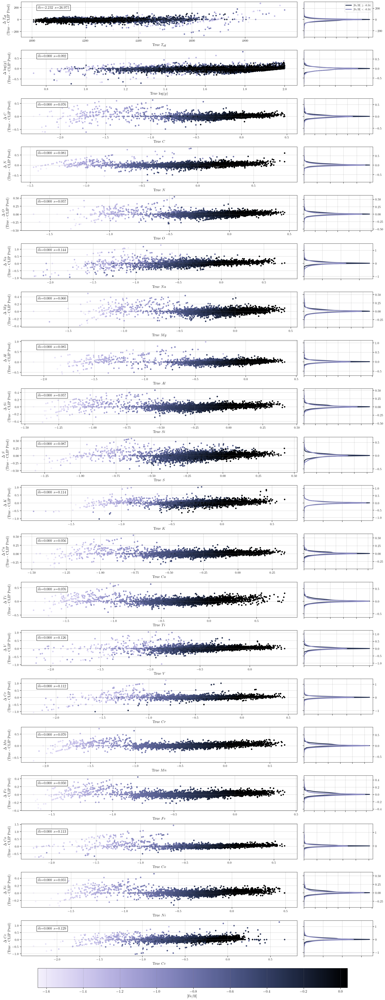

/tmp/ipykernel_4090964/4210465199.py:62: UserWarning: This figure includes Axes that are not compatible with tight_layout, so results might be incorrect.
  plt.tight_layout()
/tmp/ipykernel_4090964/4210465199.py:65: UserWarning: This figure includes Axes that are not compatible with tight_layout, so results might be incorrect.
  plt.tight_layout()


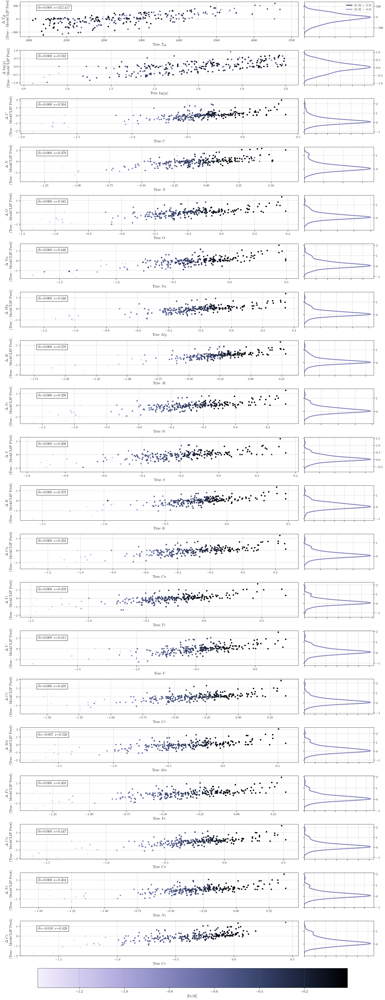

In [49]:
## Define a list of x-axis limits for each subplot ## 
def plot_residuals(targets, residue, resid_a, resid_b, z, bias, scatter, model_name, filename, x_limits = None, index_start=0):
    """
    Plot residuals and their distributions for all labels.
    
    Parameters:
    - targets: Array of true target values.
    - residue: Array of residuals for each label.
    - z: Array of [Fe/H] values for the test dataset. 
    - resid_a: Residuals for SNR values above the threshold.
    - resid_b: Residuals for SNR values below the threshold.
    - bias: List of bias values for each label.
    - scatter: List of scatter values for each label.
    - model_name: Name of model. 
    - filename: Name of file to save the figure under, ending with .png. 
    - x_limits: optional x_limits for residual plot. 
    -  - index_start: Integer to determine if index starts at 0 or 1 (to avoid Teff). Default is 0.
    """

    num_labels = targets.shape[1] 
    
    fig = plt.figure(figsize=(20, 50))
    gs = gridspec.GridSpec(20, 2, width_ratios=[4, 1])  
    
    for i in range(index_start, num_labels):
        # Adjust index for plotting
        plot_idx = i - index_start
        
        # Scatter plot for residuals
        ax0 = plt.subplot(gs[plot_idx, 0])
        points = ax0.scatter(targets[:, i], residue[:, i], c=z, s=20, cmap=cmap)

        # Set x-axis limits using the external list
        if x_limits is not None:
            ax0.set_xlim(x_limits[plot_idx])

        ax0.set_xlabel(f'True {label_names[i]}', fontsize=14)
        ax0.set_ylabel(rf'$\Delta$ {label_names[i]}' + f'\n(True - {model_name} Pred)', fontsize=14)
        ax0.tick_params(labelsize=12, width=1, length=5)

        # KDE plot for residual distributions
        ax1 = plt.subplot(gs[plot_idx, 1])
        sns.kdeplot(y=resid_a[0, :, i], color=cmap(200), lw=3, ax=ax1, label={f'[Fe/H] $\geq$ {np.percentile(z, 50):.2f}'})
        sns.kdeplot(y=resid_b[0, :, i], color=cmap(100), lw=3, ax=ax1, label={f'[Fe/H] $<$ {np.percentile(z, 50):.2f}'})
        if plot_idx == 0:
            plt.legend()

        ax1.tick_params(right=True, labelleft=False, labelright=True, labelbottom=False, labelsize=12, width=1, length=5)
        ax1.set_xlabel('')

        # Display bias and scatter values
        bbox_props = dict(boxstyle="square,pad=0.3", fc="w", ec="k", lw=1)
        plt.figtext(0.1, 0.99 - (plot_idx * 0.05),
                    rf'$\widetilde{{m}}$={bias[i]:.3f}  $s$={scatter[i]:.3f}',
                    size=14, bbox=bbox_props)

    # Add colorbar
    cbar_ax = fig.add_axes([0.1, -0.02, 0.8, 0.02])
    cbar = fig.colorbar(points, cax=cbar_ax, orientation='horizontal')
    cbar.set_label('[Fe/H]', size=14)
    cbar.ax.tick_params(labelsize=14, width=1, length=5)
    plt.tight_layout()
    fig.subplots_adjust(right=0.85)

    plt.tight_layout()
    plt.savefig(os.path.join("FIGURES", filename))
    plt.show()


CSS_true, CSS_residuals, CSS_resid_a, CSS_resid_b, CSS_bias, CSS_scatter = calculate_bias_scatter(CSS_true, 
                                                                                                  CSS_residuals,
                                                                                                  order, 
                                                                                                  inds_a, 
                                                                                                  inds_b)

mock_CSS_true, mock_CSS_residuals, mock_CSS_resid_a, mock_CSS_resid_b, mock_CSS_bias, mock_CSS_scatter = calculate_bias_scatter(mock_CSS_true, 
                                                                                                                                mock_CSS_residuals, 
                                                                                                                                mock_order, 
                                                                                                                                mock_inds_a,
                                                                                                                                mock_inds_b)


plot_residuals(CSS_true, CSS_residuals, CSS_resid_a, CSS_resid_b, z, CSS_bias, CSS_scatter, "CLIP", "AstroCLIP_CSS_residual_plots.png")

plot_residuals(mock_CSS_true, mock_CSS_residuals, mock_CSS_resid_a, mock_CSS_resid_b, mock_z, mock_CSS_bias, mock_CSS_scatter, "MockCLIP",
               "MockAstroCLIP_CSS_residual_plots.png")

### **6.2. Fill Embedding Space** <a class="anchor" id="fill-embed"></a>

In [210]:
## Fill the embedding space ## 
mock_train_indices_c, y_js_train_c, y_mjs_train_c, y_js_train_c_hat, y_mjs_train_c_hat = embed(mock_train_loader_c, model = MockCLIPModel)
mock_train_indices_c = list(itertools.chain(*[tensor.tolist() for tensor in mock_train_indices_c])) # convert to list of val

_, y_js_val_c, y_mjs_val_c, y_js_val_c_hat, y_mjs_val_c_hat = embed(mock_val_loader_c, model = MockCLIPModel)
_, y_js_test_c, y_mjs_test_c, y_js_test_c_hat, y_mjs_test_c_hat = embed(mock_test_loader_c, model = MockCLIPModel)

In [213]:
## Create new datasets with embedded vectors ##
mock_Z_train_combined = pd.DataFrame(np.vstack([y_mjs_train, y_mjs_train_c]))
mock_Z_val_combined = pd.DataFrame(np.vstack([y_mjs_val, y_mjs_val_c]))
mock_Z_test_combined = pd.DataFrame(np.vstack([y_mjs_test, y_mjs_test_c]))

mock_train_indices_combined = mock_train_indices + mock_train_indices_c 
mock_val_indices_combined = mock_val_indices + mock_val_indices_c 
mock_test_indices_combined = mock_test_indices + mock_test_indices_c 

mock_W_train_combined, mock_W_val_combined, mock_W_test_combined= map(lambda idx: jwst_labels.iloc[idx], 
                                                                      [mock_train_indices_combined, 
                                                                       mock_val_indices_combined, 
                                                                       mock_test_indices_combined])

## Print shapes ## 
print(f"Mock_Z Shape | Train {mock_Z_train_combined.shape} | Val {mock_Z_val_combined.shape} | Test {mock_Z_test_combined.shape}")
print(f"Mock_Z Labels | Train {mock_W_train_combined.shape} | Val {mock_W_val_combined.shape} | Test {mock_Z_test_combined.shape}")

Mock_Z Shape | Train (11875, 20) | Val (2375, 20) | Test (4751, 20)
Mock_Z Labels | Train (11875, 20) | Val (2375, 20) | Test (4751, 20)


### **6.3. One-Shot Learning** <a class="anchor" id="one-shot"></a>
Other forms of one-shot learning -- RF, kNN -- were ran previously in `OLD_VERSIONS/ConsLearnsNet.ipynb`.

**Reference**:

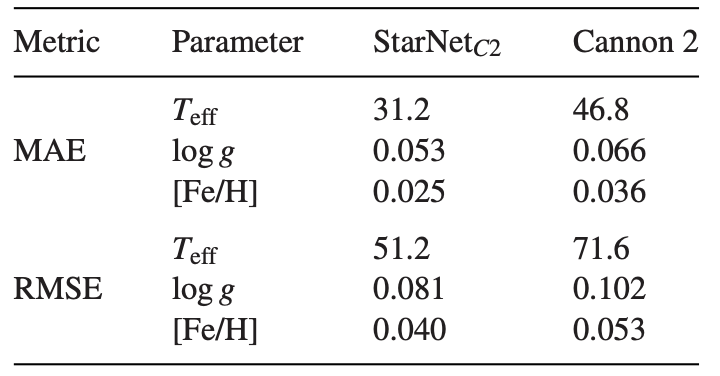

MSE: 

$T_{eff} = 2621.44$ 

$\log(g) = 0.0065$ 

$[Fe/H] = 0.0016$

#### **6.3.1. Set Up** <a class="anchor" id="1shot-set-up"></a>

##### **6.3.1.1. Helpful Datasets** <a class="anchor" id="helpful-datasets"></a>

In [111]:
## Define inputs ##
Z_train, Z_val, Z_test = map(pd.DataFrame, [y_j_train, y_j_val, y_j_test])
mock_Z_train, mock_Z_val, mock_Z_test = map(pd.DataFrame, [y_mjs_train, y_mjs_val, y_mjs_test])

## Print sizes ## 
print(f"INPUT SIZES: Original: {len(Z_train), len(Z_val), len(Z_test)} | Mock: {len(mock_Z_train), len(mock_Z_val), len(mock_Z_test)}")

INPUT SIZES: Original: (11875, 2375, 4751) | Mock: (625, 125, 250)


In [112]:
## Define outputs ## 
W_train, W_val, W_test = map(lambda idx: jwst_labels.iloc[idx], [train_indices, val_indices, test_indices])
mock_W_train, mock_W_val, mock_W_test = map(lambda idx: jwst_labels.iloc[idx], [mock_train_indices, mock_val_indices, mock_test_indices])

In [113]:
## Define modified outputs ## 
# Exclude Teff
jwst_labels_minus_Teff = jwst_labels.iloc[:, 1:] 
noTeff_train, noTeff_val, noTeff_test = map(lambda idx: jwst_labels_minus_Teff.iloc[idx], [train_indices, val_indices, test_indices])
mock_noTeff_train, mock_noTeff_val, mock_noTeff_test = map(lambda idx: jwst_labels_minus_Teff.iloc[idx], 
                                                           [mock_train_indices, mock_val_indices, mock_test_indices])

# Isolate Teff 
Teff_train, Teff_val, Teff_Test = map(lambda idx: jwst_labels["Teff"].iloc[idx], [train_indices, val_indices, test_indices]) 
mock_Teff_train, mock_Teff_val, mock_Teff_test = map(lambda idx: jwst_labels["Teff"].iloc[idx], 
                                                     [mock_train_indices, mock_val_indices, mock_test_indices]) 

In [114]:
## Scale inputs ##
Z_scaler = StandardScaler()
Z_train_scaled = pd.DataFrame(Z_scaler.fit_transform(Z_train), columns=Z_train.columns)
Z_val_scaled = pd.DataFrame(Z_scaler.transform(Z_val), columns=Z_val.columns)
Z_test_scaled = pd.DataFrame(Z_scaler.transform(Z_test), columns=Z_test.columns) 

mock_Z_scaler = StandardScaler()
mock_Z_train_scaled = pd.DataFrame(mock_Z_scaler.fit_transform(mock_Z_train), columns=mock_Z_train.columns)
mock_Z_val_scaled = pd.DataFrame(mock_Z_scaler.fit_transform(mock_Z_val), columns=mock_Z_val.columns)
mock_Z_test_scaled = pd.DataFrame(mock_Z_scaler.fit_transform(mock_Z_test), columns=mock_Z_test.columns)

## Scale outputs ## 
W_scaler = StandardScaler()
W_train_scaled = W_scaler.fit_transform(W_train)
W_val_scaled = W_scaler.transform(W_val)
W_test_scaled = W_scaler.transform(W_test)

mock_W_scaler = StandardScaler()
mock_W_train_scaled = mock_W_scaler.fit_transform(mock_W_train)
mock_W_val_scaled = mock_W_scaler.fit_transform(mock_W_val)
mock_W_test_scaled = mock_W_scaler.fit_transform(mock_W_test)

##### **6.3.1.2. Helper Functions** <a class="anchor" id="helper-functions"></a>

In [122]:
## Define denormalising function to undo StandardScaler ## 
def denormalize(scaler, labels_scaled):
    """Denormalises data scaled with StandardScaler. 
    """
    mean = scaler.mean_ 
    std = scaler.scale_
    return (labels_scaled * std) + mean

In [155]:
def evaluate_model(model, Z_train, Z_val, Z_test, W_train, W_val, W_test):
    """Generate predictions and RMSE for train, validation and test sets. Calculate the residuals for the test set. 
    """
    # Predict for train, validation and test sets 
    pred_train = model.predict(Z_train)
    pred_val = model.predict(Z_val)
    pred_test = model.predict(Z_test)

    # Calculate residuals for test set 
    test_residuals = W_test - pred_test

    # Calculate mse for train, validation and test sets
    rmse_train = np.sqrt(mean_squared_error(W_train, pred_train))
    rmse_val = np.sqrt(mean_squared_error(W_val, pred_val))
    rmse_test = np.sqrt(mean_squared_error(W_test, pred_test))

    print(f"OLS RMSE | Train: {rmse_train:.3f} | Val: {rmse_val:.3f} | Test: {rmse_test:.3f}")

    return pred_train, pred_val, pred_test, test_residuals, rmse_train, rmse_val, rmse_test

In [167]:
def print_rmse_by_cmpt(pred_train, pred_val, pred_test, W_train, W_val, W_test, num_labels):
    """Calculate component-wise mse for train, validation and test sets. 
    """
    # Suppress warnings inside the function
    with warnings.catch_warnings():
        warnings.simplefilter("ignore")
        
        rmse_train_cmpts = np.sqrt(np.mean((W_train - pred_train)**2, axis=0))
        rmse_val_cmpts = np.sqrt(np.mean((W_val - pred_val)**2, axis=0))
        rmse_test_cmpts = np.sqrt(np.mean((W_test - pred_test)**2, axis=0))

        for i in range(num_labels):
            if num_labels == 19:
                print(f"{jwst_labels.columns[i + 1]} | Train: {rmse_train_cmpts[i]:.3f} | Validation: {rmse_val_cmpts[i]:.3f} | Test: {rmse_test_cmpts[i]:.3f}")
            elif num_labels == 20:
                 print(f"{jwst_labels.columns[i]} | Train: {rmse_train_cmpts[i]:.3f} | Validation: {rmse_val_cmpts[i]:.3f} | Test: {rmse_test_cmpts[i]:.3f}")

#### **6.3.2. Linear Regression** <a class="anchor" id="lin-reg"></a>

##### **6.3.1.1. One model to predict all except $T_{eff}$** <a class="anchor" id="LR-no-Teff"></a>

 I take out Teff, and analyse the mapping separately (because its scale messes things up). 

In [144]:
## Fit linear models ## 
noTeff_LinearModel = LinearRegression()
noTeff_LinearModel.fit(Z_train, noTeff_train)

# Initialize LassoCV with cross-validation
noTeff_MockLinearModel = MultiTaskElasticNetCV(cv=5, random_state=42, max_iter=5000)
noTeff_MockLinearModel.fit(mock_Z_train, mock_noTeff_train)

# Get the best alpha found by LassoCV
best_alpha = noTeff_MockLinearModel.alpha_
best_l1_ratio = noTeff_MockLinearModel.l1_ratio_
print(f"Best alpha: {best_alpha:.3f}")
print(f"Best l1_ratio: {best_l1_ratio}")

Best alpha: 0.022
Best l1_ratio: 0.5


In [156]:
## Evaluate model ##
OLS_noTeff_pred_train, OLS_noTeff_pred_val, OLS_noTeff_pred_test, OLS_noTeff_residuals, OLS_noTeff_rmse_train, OLS_noTeff_rmse_val, OLS_noTeff_rmse_test = evaluate_model(noTeff_LinearModel, Z_train, Z_val, Z_test, noTeff_train, noTeff_val, noTeff_test)
mock_OLS_noTeff_pred_train, mock_OLS_noTeff_pred_val, mock_OLS_noTeff_pred_test, mock_OLS_noTeff_residuals, mock_OLS_noTeff_rmse_train, mock_OLS_noTeff_rmse_val, mock_OLS_noTeff_rmse_test = evaluate_model(noTeff_MockLinearModel, mock_Z_train, mock_Z_val, mock_Z_test, mock_noTeff_train, mock_noTeff_val, mock_noTeff_test)

OLS RMSE | Train: 0.063 | Val: 0.062 | Test: 0.064
OLS RMSE | Train: 0.285 | Val: 0.319 | Test: 0.316


In [157]:
## Calculate component-wise rmse ##
print_rmse_by_cmpt(OLS_noTeff_pred_train, OLS_noTeff_pred_val, OLS_noTeff_pred_test, noTeff_train, noTeff_val, noTeff_test, 19) 
print("\n")
print_rmse_by_cmpt(mock_OLS_noTeff_pred_train, mock_OLS_noTeff_pred_val, mock_OLS_noTeff_pred_test, mock_noTeff_train, mock_noTeff_val, mock_noTeff_test, 19) 

logg | Train: 0.053 | Validation: 0.050 | Test: 0.052
C | Train: 0.051 | Validation: 0.050 | Test: 0.051
N | Train: 0.060 | Validation: 0.055 | Test: 0.059
O | Train: 0.032 | Validation: 0.030 | Test: 0.032
Na | Train: 0.114 | Validation: 0.113 | Test: 0.113
Mg | Train: 0.030 | Validation: 0.029 | Test: 0.031
Al | Train: 0.060 | Validation: 0.060 | Test: 0.056
Si | Train: 0.030 | Validation: 0.030 | Test: 0.029
S | Train: 0.065 | Validation: 0.064 | Test: 0.063
K | Train: 0.084 | Validation: 0.079 | Test: 0.079
Ca | Train: 0.031 | Validation: 0.031 | Test: 0.031
Ti | Train: 0.047 | Validation: 0.045 | Test: 0.044
V | Train: 0.095 | Validation: 0.092 | Test: 0.098
Cr | Train: 0.071 | Validation: 0.068 | Test: 0.077
Mn | Train: 0.050 | Validation: 0.049 | Test: 0.049
Fe | Train: 0.030 | Validation: 0.029 | Test: 0.029
Co | Train: 0.064 | Validation: 0.061 | Test: 0.071
Ni | Train: 0.035 | Validation: 0.035 | Test: 0.035
Ce | Train: 0.105 | Validation: 0.110 | Test: 0.107


logg | Train: 

In [57]:
## Plot residuals # 
#OLS_true, OLS_residuals, OLS_resid_a, OLS_resid_b, OLS_bias, OLS_scatter = calculate_bias_scatter(noTeff_test, OLS_residuals, order, 
                                                                                                 # inds_a, inds_b)
#plot_residuals(OLS_true, OLS_residuals, OLS_resid_a, OLS_resid_b, z, OLS_bias, OLS_scatter, "CLIP", "AstroCLIP_OLS_residual_plots.png",
               #index_start=1)

In [58]:
## Plot residuals # 
#mock_OLS_true, mock_OLS_residuals, mock_OLS_resid_a, mock_OLS_resid_b, mock_OLS_bias, mock_OLS_scatter = calculate_bias_scatter(
    #mock_noTeff_test, mock_OLS_residuals, mock_order, mock_inds_a, mock_inds_b)

#plot_residuals(mock_OLS_true, mock_OLS_residuals, mock_OLS_resid_a, mock_OLS_resid_b, mock_z, mock_OLS_bias, mock_OLS_scatter,
               #"MockCLIP", "MockAstroCLIP_OLS_residual_plots.png", index_start=1)

##### **6.3.1.2. One model to predict $T_{eff}$** <a class="anchor" id="LR-no-Teff"></a>

In [148]:
## Define and fit linear model ## 
Teff_LinearModel = LinearRegression()
Teff_LinearModel.fit(Z_train_scaled, Teff_train)

## Define and fit mock linear model ## 
Teff_MockLinearModel = ElasticNetCV(cv=5, random_state=42)
Teff_MockLinearModel.fit(mock_Z_train_scaled, mock_Teff_train)

# Get the best alpha and l1_ratio from the cross-validation
best_alpha = mock_Teff_LinearModel.alpha_
best_l1_ratio = mock_Teff_LinearModel.l1_ratio_

print(f"Best alpha: {best_alpha}")
print(f"Best l1_ratio: {best_l1_ratio}")

Best alpha: 16.022065625
Best l1_ratio: 0.5


In [158]:
## Evaluate model ##
OLS_Teff_pred_train, OLS_Teff_pred_val, OLS_Teff_pred_test, OLS_Teff_residuals, OLS_Teff_mse_train, OLS_Teff_mse_val, OLS_Teff_mse_test = evaluate_model(Teff_LinearModel, Z_train, Z_val, Z_test, Teff_train, Teff_val, Teff_test)
mock_OLS_Teff_pred_train, mock_OLS_Teff_pred_val, mock_OLS_Teff_pred_test, mock_OLS_Teff_residuals, mock_OLS_Teff_mse_train, mock_OLS_Teff_mse_val, mock_OLS_Teff_mse_test = evaluate_model(Teff_MockLinearModel, mock_Z_train, mock_Z_val, mock_Z_test, mock_Teff_train, mock_Teff_val, mock_Teff_test)

OLS RMSE | Train: 135.945 | Val: 128.611 | Test: 135.288
OLS RMSE | Train: 140.517 | Val: 155.088 | Test: 149.807


In [159]:
## Update OLS_residuals to include OLS_Teff_residuals ## 
OLS_Teff_residuals = pd.DataFrame(OLS_Teff_residuals)
OLS_noTeff_residuals.insert(0, 'Teff', OLS_Teff_residuals)

mock_OLS_Teff_residuals = pd.DataFrame(mock_OLS_Teff_residuals)
mock_OLS_noTeff_residuals.insert(0, 'Teff', mock_OLS_Teff_residuals)

/tmp/ipykernel_4090964/4210465199.py:62: UserWarning: This figure includes Axes that are not compatible with tight_layout, so results might be incorrect.
  plt.tight_layout()
/tmp/ipykernel_4090964/4210465199.py:65: UserWarning: This figure includes Axes that are not compatible with tight_layout, so results might be incorrect.
  plt.tight_layout()


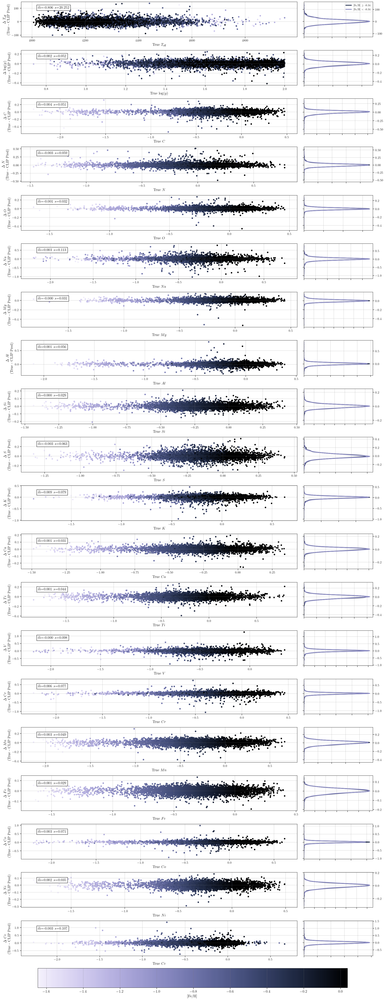

In [160]:
## Plot residuals # 
OLS_true, OLS_residuals, OLS_resid_a, OLS_resid_b, OLS_bias, OLS_scatter = calculate_bias_scatter(W_test, OLS_residuals, order, 
                                                                                                  inds_a, inds_b)

plot_residuals(OLS_true, OLS_residuals, OLS_resid_a, OLS_resid_b, z, OLS_bias, OLS_scatter, "CLIP", "AstroCLIP_OLS_residual_plots.png")

/tmp/ipykernel_4090964/4210465199.py:62: UserWarning: This figure includes Axes that are not compatible with tight_layout, so results might be incorrect.
  plt.tight_layout()
/tmp/ipykernel_4090964/4210465199.py:65: UserWarning: This figure includes Axes that are not compatible with tight_layout, so results might be incorrect.
  plt.tight_layout()


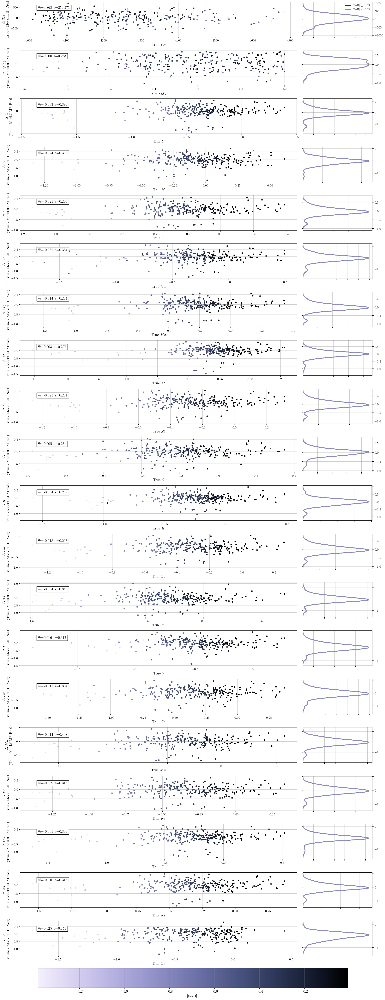

In [161]:
## Plot residuals # 
mock_OLS_true, mock_OLS_residuals, mock_OLS_resid_a, mock_OLS_resid_b, mock_OLS_bias, mock_OLS_scatter = calculate_bias_scatter(
    mock_W_test, mock_OLS_residuals, mock_order, mock_inds_a, mock_inds_b)

plot_residuals(mock_OLS_true, mock_OLS_residuals, mock_OLS_resid_a, mock_OLS_resid_b, mock_z, mock_OLS_bias, mock_OLS_scatter,
               "MockCLIP", "MockAstroCLIP_OLS_residual_plots.png")

##### **6.3.1.3. On combined dataset** <a class="anchor" id="LR-c"></a>

In [172]:
## Define and fit linear model ## 
CombinedLinearModel = LinearRegression()
CombinedLinearModel.fit(Z_train, W_train)

## Define and fit mock linear model ##
# Initialize LassoCV with cross-validation
CombinedMockLinearModel = LinearRegression() 
CombinedMockLinearModel.fit(mock_Z_train_combined, mock_W_train_combined)

LinearRegression()

In [173]:
## Evaluate model ##
OLS_pred_train, OLS_pred_val, OLS_pred_test, OLS_residuals, OLS_rmse_train, OLS_rmse_val, OLS_rmse_test = evaluate_model(CombinedLinearModel, Z_train, Z_val, Z_test, W_train, W_val, W_test)
mock_OLS_pred_train, mock_OLS_pred_val, mock_OLS_pred_test, mock_OLS_residuals, mock_OLS_rmse_train, mock_OLS_rmse_val, mock_OLS_rmse_test = evaluate_model(CombinedMockLinearModel, mock_Z_train_combined, mock_Z_val_combined, mock_Z_test_combined, mock_W_train_combined, mock_W_val_combined, mock_W_test_combined)

OLS RMSE | Train: 4.620 | Val: 4.360 | Test: 4.529
OLS RMSE | Train: 33.687 | Val: 33.844 | Test: 33.591


In [174]:
## Print component-wise rmse ## 
print_rmse_by_cmpt(OLS_pred_train, OLS_pred_val, OLS_pred_test, W_train, W_val, W_test, 20) 
print("\n")
print_rmse_by_cmpt(mock_OLS_pred_train, mock_OLS_pred_val, mock_OLS_pred_test, mock_W_train_combined, mock_W_val_combined, mock_W_test_combined, 20) 

Teff | Train: 20.659 | Validation: 19.499 | Test: 20.252
logg | Train: 0.053 | Validation: 0.050 | Test: 0.052
C | Train: 0.051 | Validation: 0.050 | Test: 0.051
N | Train: 0.060 | Validation: 0.055 | Test: 0.059
O | Train: 0.032 | Validation: 0.030 | Test: 0.032
Na | Train: 0.114 | Validation: 0.113 | Test: 0.113
Mg | Train: 0.030 | Validation: 0.029 | Test: 0.031
Al | Train: 0.060 | Validation: 0.060 | Test: 0.056
Si | Train: 0.030 | Validation: 0.030 | Test: 0.029
S | Train: 0.065 | Validation: 0.064 | Test: 0.063
K | Train: 0.084 | Validation: 0.079 | Test: 0.079
Ca | Train: 0.031 | Validation: 0.031 | Test: 0.031
Ti | Train: 0.047 | Validation: 0.045 | Test: 0.044
V | Train: 0.095 | Validation: 0.092 | Test: 0.098
Cr | Train: 0.071 | Validation: 0.068 | Test: 0.077
Mn | Train: 0.050 | Validation: 0.049 | Test: 0.049
Fe | Train: 0.030 | Validation: 0.029 | Test: 0.029
Co | Train: 0.064 | Validation: 0.061 | Test: 0.071
Ni | Train: 0.035 | Validation: 0.035 | Test: 0.035
Ce | Train:

#### **6.3.2. Quadratic Regression** <a class="anchor" id="quad-reg"></a>

In [177]:
## Define polynomial features for quadratic regression ##
poly = PolynomialFeatures(degree = 2, include_bias = False)
mock_poly = PolynomialFeatures(degree = 2, include_bias = False) 

## Transform the training data to include polynomial features ## 
Z_train_poly = poly.fit_transform(Z_train)
mock_Z_train_poly = mock_poly.fit_transform(mock_Z_train_combined)

## Transform validation and test data using the fitted transformer ## 
Z_val_poly = poly.transform(Z_val)
Z_test_poly = poly.transform(Z_test)

mock_Z_val_poly = mock_poly.transform(mock_Z_val_combined) 
mock_Z_test_poly = mock_poly.transform(mock_Z_test_combined)

In [178]:
## Fit QR model ##
CombinedLinearModel2 = LinearRegression()
CombinedMockLinearModel2 = LinearRegression() 

CombinedLinearModel2.fit(Z_train_poly, W_train)
CombinedMockLinearModel2.fit(mock_Z_train_poly, mock_W_train_combined) 

# Print the best alpha value
print("Best alpha:", noTeff_MockLinearModel.alpha_)

Best alpha: 0.022381228637695313


In [181]:
## Evaluate model ##
QR_pred_train, QR_pred_val, QR_pred_test, QR_residuals, QR_rmse_train, QR_rmse_val, QR_rmse_test = evaluate_model(CombinedLinearModel2, Z_train_poly, Z_val_poly, Z_test_poly, W_train, W_val, W_test)
mock_QR_pred_train, mock_QR_pred_val, mock_QR_pred_test, mock_QR_residuals, mock_QR_rmse_train, mock_QR_rmse_val, mock_QR_rmse_test = evaluate_model(CombinedMockLinearModel2, mock_Z_train_poly, mock_Z_val_poly, mock_Z_test_poly, mock_W_train_combined, mock_W_val_combined, mock_W_test_combined)

OLS RMSE | Train: 1.390 | Val: 1.411 | Test: 1.385
OLS RMSE | Train: 33.400 | Val: 34.115 | Test: 33.887


In [182]:
## Calculate component-wise rmse ##
print_rmse_by_cmpt(QR_pred_train, QR_pred_val, QR_pred_test, W_train, W_val, W_test, 20) 
print("\n")
print_rmse_by_cmpt(mock_QR_pred_train, mock_QR_pred_val, mock_QR_pred_test, mock_W_train_combined, mock_W_val_combined, mock_W_test_combined, 20) 

Teff | Train: 6.211 | Validation: 6.307 | Test: 6.192
logg | Train: 0.036 | Validation: 0.038 | Test: 0.038
C | Train: 0.017 | Validation: 0.019 | Test: 0.019
N | Train: 0.020 | Validation: 0.024 | Test: 0.024
O | Train: 0.013 | Validation: 0.013 | Test: 0.013
Na | Train: 0.082 | Validation: 0.082 | Test: 0.087
Mg | Train: 0.011 | Validation: 0.012 | Test: 0.013
Al | Train: 0.036 | Validation: 0.040 | Test: 0.039
Si | Train: 0.016 | Validation: 0.017 | Test: 0.017
S | Train: 0.056 | Validation: 0.057 | Test: 0.057
K | Train: 0.077 | Validation: 0.074 | Test: 0.074
Ca | Train: 0.019 | Validation: 0.020 | Test: 0.021
Ti | Train: 0.027 | Validation: 0.028 | Test: 0.029
V | Train: 0.083 | Validation: 0.082 | Test: 0.090
Cr | Train: 0.054 | Validation: 0.055 | Test: 0.063
Mn | Train: 0.025 | Validation: 0.027 | Test: 0.028
Fe | Train: 0.008 | Validation: 0.009 | Test: 0.009
Co | Train: 0.052 | Validation: 0.048 | Test: 0.062
Ni | Train: 0.018 | Validation: 0.018 | Test: 0.019
Ce | Train: 0.

/tmp/ipykernel_4090964/4210465199.py:62: UserWarning: This figure includes Axes that are not compatible with tight_layout, so results might be incorrect.
  plt.tight_layout()
/tmp/ipykernel_4090964/4210465199.py:65: UserWarning: This figure includes Axes that are not compatible with tight_layout, so results might be incorrect.
  plt.tight_layout()


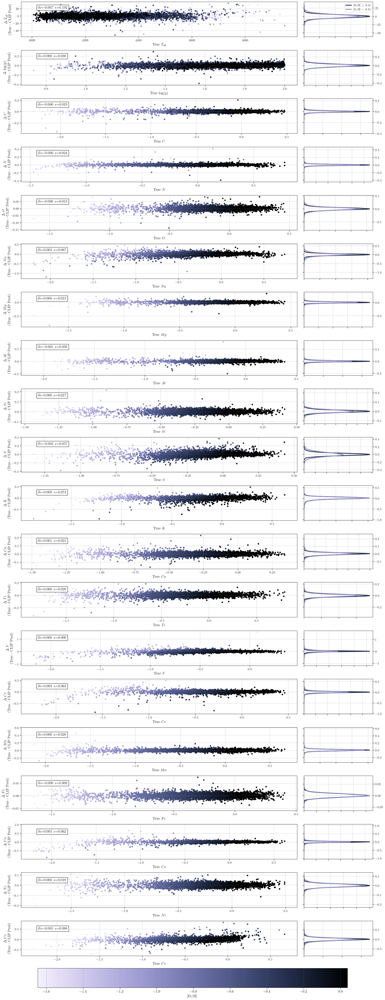

In [183]:
## Plot residuals # 
QR_true, QR_residuals, QR_resid_a, QR_resid_b, QR_bias, QR_scatter = calculate_bias_scatter(W_test, QR_residuals, order, 
                                                                                                  inds_a, inds_b)

plot_residuals(QR_true, QR_residuals, QR_resid_a, QR_resid_b, z, QR_bias, QR_scatter, "CLIP", "AstroCLIP_QR_residual_plots.png")

/tmp/ipykernel_4090964/4210465199.py:62: UserWarning: This figure includes Axes that are not compatible with tight_layout, so results might be incorrect.
  plt.tight_layout()
/tmp/ipykernel_4090964/4210465199.py:65: UserWarning: This figure includes Axes that are not compatible with tight_layout, so results might be incorrect.
  plt.tight_layout()


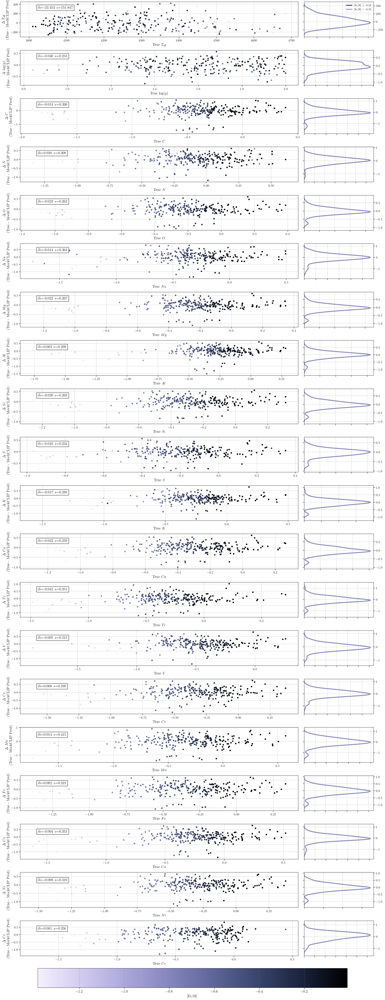

In [185]:
mock_QR_true, mock_QR_residuals, mock_QR_resid_a, mock_QR_resid_b, mock_QR_bias, mock_QR_scatter = calculate_bias_scatter(
    mock_W_test_combined, mock_QR_residuals, mock_order, mock_inds_a, mock_inds_b)

plot_residuals(mock_QR_true, mock_QR_residuals, mock_QR_resid_a, mock_QR_resid_b, mock_z, mock_QR_bias, mock_QR_scatter, 
               "MockCLIP", "MockAstroCLIP_QR_residual_plots.png")

#### **6.3.3. Neural Network** <a class="anchor" id="neural-net"></a>

In [218]:
## Convert inputs to Tensors ##
Z_train_tensor, Z_val_tensor, Z_test_tensor = map(torch.Tensor, [Z_train, Z_val, Z_test])
mock_Z_train_tensor, mock_Z_val_tensor, mock_Z_test_tensor = map(torch.Tensor, [y_mjs_train, y_mjs_val, y_mjs_test])

## Define output as Tensors ##
W_train, W_val, W_test = map(lambda idx: torch.Tensor(jwst_labels.iloc[idx].to_numpy()), [train_indices, val_indices, test_indices])
mock_W_train, mock_W_val, mock_W_test = map(lambda idx: torch.Tensor(jwst_labels.iloc[idx].to_numpy()), 
                                           [mock_train_indices, mock_val_indices, mock_test_indices])

In [227]:
## Define neural network ## 
class SimpleFCNN(nn.Module):
    def __init__(self, input_dim, hidden_dim1, hidden_dim2, hidden_dim3, output_dim):
        super(SimpleFCNN, self).__init__()
        self.fc1 = nn.Linear(input_dim, hidden_dim1)
        self.fc2 = nn.Linear(hidden_dim1, hidden_dim2)
        self.fc3 = nn.Linear(hidden_dim2, hidden_dim3)
        self.fc4 = nn.Linear(hidden_dim3, output_dim)
    
    def forward(self, x):
        x = F.relu(self.fc1(x))
        x = F.relu(self.fc2(x))
        x = F.relu(self.fc3(x))
        x = self.fc4(x)  
        return x

class MockSimpleFCNN(nn.Module):
    def __init__(self, input_dim, hidden_dim1, hidden_dim2, hidden_dim3, output_dim):
        super(MockSimpleFCNN, self).__init__()
        self.fc1 = nn.Linear(input_dim, hidden_dim1)
        self.fc2 = nn.Linear(hidden_dim1, hidden_dim2)
        self.fc3 = nn.Linear(hidden_dim2, hidden_dim3)
        self.fc4 = nn.Linear(hidden_dim3, output_dim) 
        self.dropout = nn.Dropout(0.2)
    
    def forward(self, x):
        x = F.relu(self.fc1(x))
        x = F.relu(self.fc2(x))
        x = self.dropout(x)
        x = F.relu(self.fc3(x))  # Linear activation for the output layer
        x = self.fc4(x) 
        return x

## Instantiate neural network parameters ## 
input_dim = 20
hidden_dim1 = 256
hidden_dim2 = 128
hidden_dim3 = 64
output_dim = 20
num_epochs = 1000

mock_hidden_dim1 = 256
mock_hidden_dim2 = 128
mock_hidden_dim3 = 64
mock_num_epochs = 1000

In [228]:
## Instantiate model ## 
SimpleModel = SimpleFCNN(input_dim, hidden_dim1, hidden_dim2, hidden_dim3, output_dim)
MockSimpleModel = MockSimpleFCNN(input_dim, mock_hidden_dim1, mock_hidden_dim2, mock_hidden_dim3, output_dim) 

## Move to GPU ## 
device = torch.device("cuda" if torch.cuda.is_available() else "cpu") 
SimpleModel.to(device)
MockSimpleModel.to(device) 

## Define MSE Loss, optimiser and scheduler ## 
criterion = nn.MSELoss()
optimizer = torch.optim.Adam(SimpleModel.parameters(), lr=1e-3, weight_decay=1e-3)
scheduler = lr_scheduler.ReduceLROnPlateau(optimizer) 

mock_criterion = nn.MSELoss()
mock_optimizer = torch.optim.Adam(MockSimpleModel.parameters(), lr=1e-3, weight_decay=1e-4)
mock_scheduler = lr_scheduler.ReduceLROnPlateau(optimizer, patience=10)

In [229]:
def train_SimpleFCNN(Z_train, Z_val, W_train, W_val, model, num_epochs, optimizer, criterion, scheduler, device='cpu'):
    """
    Function to train a simple Fully Connected Neural Network (FCNN) model.
    
    Parameters:
    Z_train (torch.Tensor): The training data inputs.
    Z_val (torch.Tensor): The validation data inputs.
    W_train (torch.Tensor): The training data targets.
    W_val (torch.Tensor): The validation data targets.
    model (torch.nn.Module): The neural network model to be trained.
    num_epochs (int): Number of epochs for training.
    optimizer (torch.optim.Optimizer): Optimizer for training.
    criterion (torch.nn.Module): Loss function.
    scheduler (torch.optim.lr_scheduler): Learning rate scheduler.
    device (str): Device to train the model on ('cpu' or 'cuda').
    
    Returns:
    train_losses (list): List of training losses per epoch.
    val_losses (list): List of validation losses per epoch.
    """
    train_losses = []
    val_losses = []

    model = model.to(device)
    Z_train, Z_val = Z_train.to(device), Z_val.to(device)
    W_train, W_val = W_train.to(device), W_val.to(device)

    for epoch in range(num_epochs):
        # Training step
        model.train()
        optimizer.zero_grad()
        
        outputs = model(Z_train)
        loss = criterion(outputs, W_train)
        loss.backward()
        optimizer.step()
        
        train_losses.append(loss.item())
        
        if (epoch + 1) % 10 == 0:
            print(f'EPOCH [{epoch+1}/{num_epochs}]: Train Loss: {loss.item():.4f}')

        # Validation step
        model.eval()
        with torch.no_grad():
            val_outputs = model(Z_val)
            val_loss = criterion(val_outputs, W_val)
            val_losses.append(val_loss.item())
            
            scheduler.step(val_loss)
        
        if (epoch + 1) % 10 == 0:
            print(f'Validation Loss: {val_loss.item():.4f}')
    
    return train_losses, val_losses

print("SIMPLE MODEL:")
train_losses, val_losses = train_SimpleFCNN(Z_train, Z_val, W_train, W_val, SimpleModel, num_epochs, optimizer, criterion, scheduler, device)

print("\nMOCK SIMPLE MODEL:")
mock_train_losses, mock_val_losses = train_SimpleFCNN(mock_Z_train, mock_Z_val, mock_W_train, mock_W_val, MockSimpleModel, 
                                                      mock_num_epochs, mock_optimizer, mock_criterion, mock_scheduler, device)

SIMPLE MODEL:
EPOCH [10/1000]: Train Loss: 912919.8125
Validation Loss: 913307.0625
EPOCH [20/1000]: Train Loss: 912519.9375
Validation Loss: 912865.3125
EPOCH [30/1000]: Train Loss: 911470.3750
Validation Loss: 911726.7500
EPOCH [40/1000]: Train Loss: 909053.4375
Validation Loss: 909139.0625
EPOCH [50/1000]: Train Loss: 904021.0000
Validation Loss: 903811.5000
EPOCH [60/1000]: Train Loss: 894388.5000
Validation Loss: 893710.0000
EPOCH [70/1000]: Train Loss: 877201.2500
Validation Loss: 875829.8750
EPOCH [80/1000]: Train Loss: 848402.5625
Validation Loss: 846083.9375
EPOCH [90/1000]: Train Loss: 802875.8750
Validation Loss: 799354.5000
EPOCH [100/1000]: Train Loss: 735011.0625
Validation Loss: 730137.8125
EPOCH [110/1000]: Train Loss: 640537.1250
Validation Loss: 634431.8125
EPOCH [120/1000]: Train Loss: 519042.2500
Validation Loss: 512158.5938
EPOCH [130/1000]: Train Loss: 377889.9375
Validation Loss: 371255.4688
EPOCH [140/1000]: Train Loss: 237480.7656
Validation Loss: 232555.2812
E

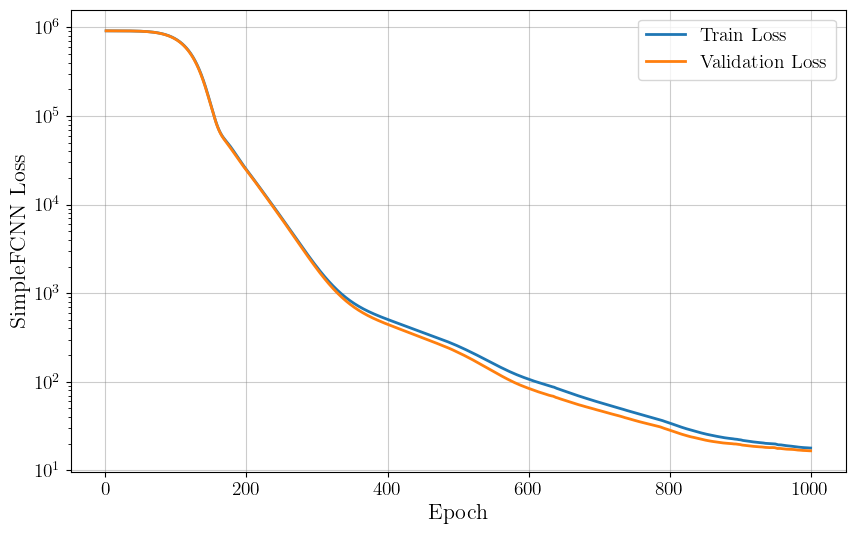

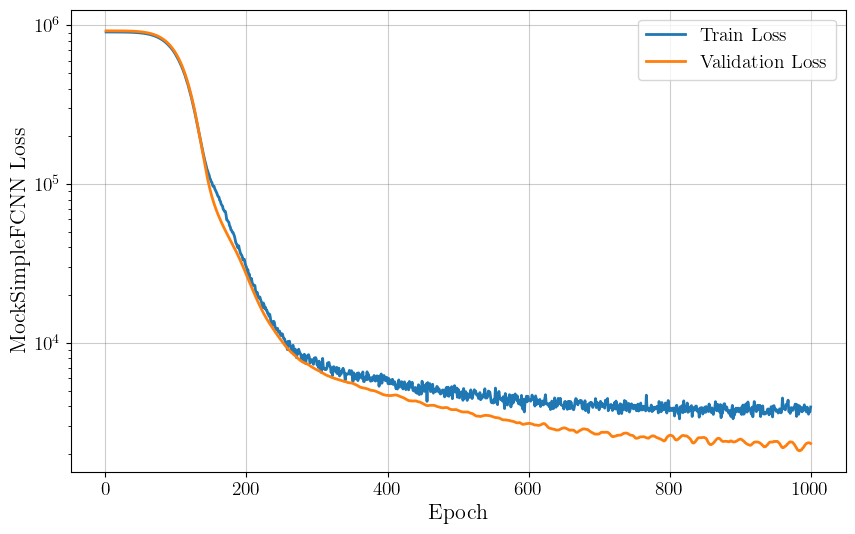

In [230]:
## Plot losses ## 
def plot_losses( train_losses, val_losses, num_epochs, model_name):
    """
    Plots training and validation losses over epochs. Save figure to "FIGURES" directory. 

    Args:
    - train_losses (list): contains training losses for each epoch.
    - val_losses (list): contains validation losses for each epoch.
    - num_epochs (int): Number of epochs for training.
    - model_name (str): e.g., 'APOGEE' or 'JWST'.
    """
    plt.figure(figsize=(10, 6))  
    plt.plot(range(1, num_epochs+1), train_losses, label="Train Loss", linewidth=2)
    plt.plot(range(1, num_epochs+1), val_losses, label="Validation Loss", linewidth=2)
    plt.xlabel("Epoch", fontsize=16)
    plt.yscale('log')  # Set y-axis to logarithmic scale 
    plt.ylabel(f"{model_name} Loss", fontsize=16)
    plt.legend(fontsize=14)
    plt.xticks(fontsize=14)
    plt.yticks(fontsize=14) 
    
    # Save the figure
    plt.savefig(os.path.join("FIGURES", f"AstroCLIP_{model_name}_loss_plot.png"))
    plt.show()
    plt.close()

plot_losses(train_losses, val_losses, num_epochs, "SimpleFCNN")
plot_losses(mock_train_losses, mock_val_losses, mock_num_epochs, "MockSimpleFCNN")

In [231]:
# Original model 
SimpleModel.eval()
with torch.no_grad():
    test_outputs = SimpleModel(Z_test.to(device))
    test_mse = mean_squared_error(W_test.cpu().numpy(), test_outputs.cpu().numpy())

NN_pred_test = test_outputs.cpu().numpy()
NN_residuals = W_test.cpu().numpy() - NN_pred_test

print(f'Train MSE: {train_losses[-1]:.4f} | Val MSE: {val_losses[-1]:.4f} |Test MSE: {test_mse:.4f}')

# Mock 
MockSimpleModel.eval()
with torch.no_grad():
    mock_test_outputs = MockSimpleModel(mock_Z_test.to(device))
    mock_test_mse = mean_squared_error(mock_W_test.cpu().numpy(), mock_test_outputs.cpu().numpy())

mock_NN_pred_test = mock_test_outputs.cpu().numpy()
mock_NN_residuals = mock_W_test.cpu().numpy() - mock_NN_pred_test

print(f'Train MSE: {mock_train_losses[-1]:.4f} | Val MSE: {mock_val_losses[-1]:.4f} |Test MSE: {mock_test_mse:.4f}')

Train MSE: 17.8830 | Val MSE: 16.6321 |Test MSE: 18.1166
Train MSE: 3951.4990 | Val MSE: 2327.1685 |Test MSE: 1926.5056


In [232]:
## Calculate component-wise mse ##
NN_mse_test_cmpts = np.mean((W_test.cpu().numpy() - test_outputs.cpu().numpy())**2, axis=0)

print("QR NN (component-wise):")
for i in range(num_jwst_labels - 1):  
    print(f"{jwst_labels.columns[i + 1]}: | Test: {NN_mse_test_cmpts[i]:.3f}")

mock_NN_mse_test_cmpts = np.mean((mock_W_test.cpu().numpy() - mock_test_outputs.cpu().numpy())**2, axis=0)

print("\nMock NN MSE (component-wise):")
for i in range(num_jwst_labels - 1):  
    print(f"{jwst_labels.columns[i + 1]}: | Test: {mock_NN_mse_test_cmpts[i]:.3f}")

QR NN (component-wise):
logg: | Test: 353.599
C: | Test: 0.053
N: | Test: 1.043
O: | Test: 0.103
Na: | Test: 0.309
Mg: | Test: 0.153
Al: | Test: 0.131
Si: | Test: 1.237
S: | Test: 0.083
K: | Test: 0.054
Ca: | Test: 0.099
Ti: | Test: 0.080
V: | Test: 0.260
Cr: | Test: 1.034
Mn: | Test: 0.126
Fe: | Test: 2.087
Co: | Test: 0.491
Ni: | Test: 0.767
Ce: | Test: 0.334

Mock NN MSE (component-wise):
logg: | Test: 38522.402
C: | Test: 0.528
N: | Test: 0.145
O: | Test: 0.231
Na: | Test: 0.195
Mg: | Test: 0.146
Al: | Test: 0.177
Si: | Test: 0.097
S: | Test: 0.309
K: | Test: 0.326
Ca: | Test: 0.106
Ti: | Test: 1.223
V: | Test: 0.326
Cr: | Test: 0.293
Mn: | Test: 0.508
Fe: | Test: 0.188
Co: | Test: 0.102
Ni: | Test: 1.358
Ce: | Test: 1.159


In [ ]:
## Plot residuals # 
#NN_true, NN_residuals, NN_resid_a, NN_resid_b, NN_bias, NN_scatter = calculate_bias_scatter(W_test, NN_residuals, order, inds_a, inds_b)
#plot_residuals(NN_true, NN_residuals, NN_resid_a, NN_resid_b, z, NN_bias, NN_scatter, "CLIP", "AstroCLIP_NN_residual_plots.png")

In [ ]:
## Plot residuals # 
#mock_NN_true, mock_NN_residuals, mock_NN_resid_a, mock_NN_resid_b, mock_NN_bias, mock_NN_scatter = calculate_bias_scatter(mock_W_test, 
                                                                                                                         #mock_NN_residuals, 
                                                                                                                         #mock_order, 
                                                                                                                         #mock_inds_a,
                                                                                                                        #mock_inds_b)
#plot_residuals(mock_NN_true, mock_NN_residuals, mock_NN_resid_a, mock_NN_resid_b, mock_z, mock_NN_bias, mock_NN_scatter,
               #"MockCLIP", "MockAstroCLIP_NN_residual_plots.png")

#### **6.3.4. kNN??? [I don't understand this]** <a class="anchor" id="kNN"></a>

In [191]:
## Combine training and validation sets for kNN training ##
Z_train_val_combined = pd.concat([Z_train, Z_val]) 
W_train_val_combined = pd.concat([W_train, W_val]) 

mock_Z_train_val_combined = pd.concat([mock_Z_train_combined, mock_Z_val_combined]) 
mock_W_train_val_combined = pd.concat([mock_W_train_combined, mock_W_val_combined]) 

## Define parameter grid ## 
param_grid = {'n_neighbors': list(range(1, 101))}

## Initialize GridSearchCV ##
grid_search = GridSearchCV(estimator=KNeighborsRegressor(), param_grid=param_grid, cv=10, n_jobs=-1, scoring='neg_mean_squared_error')
mock_grid_search = GridSearchCV(estimator=KNeighborsRegressor(), param_grid=param_grid, cv=10, n_jobs=-1, scoring='neg_mean_squared_error')

## Fit grid search to data ##
grid_search.fit(Z_train_val_combined, W_train_val_combined)
mock_grid_search.fit(mock_Z_train_val_combined, mock_W_train_val_combined)

## Get best parameters ##
best_params = grid_search.best_params_
print(f"Best parameters found: {best_params}")
mock_best_params = mock_grid_search.best_params_
print(f"MOCK: Best parameters found: {mock_best_params}")

Best parameters found: {'n_neighbors': 6}
MOCK: Best parameters found: {'n_neighbors': 100}


In [195]:
## Get best model ## 
kNNModel = grid_search.best_estimator_
MockkNNModel = mock_grid_search.best_estimator_

In [196]:
## Evaluate ##
kNN_pred_train, kNN_pred_val, kNN_pred_test, kNN_residuals, kNN_rmse_train, kNN_rmse_val, kNN_rmse_test = evaluate_model(kNNModel, Z_train, Z_val, Z_test, W_train, W_val, W_test)
mock_kNN_pred_train, mock_kNN_pred_val, mock_kNN_pred_test, mock_kNN_residuals, mock_kNN_rmse_train, mock_kNN_rmse_val, mock_kNN_rmse_test = evaluate_model(MockkNNModel, mock_Z_train_combined, mock_Z_val_combined, mock_Z_test_combined, mock_W_train_combined, mock_W_val_combined, mock_W_test_combined)

OLS RMSE | Train: 2.396 | Val: 2.263 | Test: 2.896
OLS RMSE | Train: 33.514 | Val: 33.667 | Test: 33.762


In [197]:
## Compute component-wise rmse ##
print_rmse_by_cmpt(kNN_pred_train, kNN_pred_val, kNN_pred_test, W_train, W_val, W_test, 20) 
print("\n")
print_rmse_by_cmpt(mock_kNN_pred_train, mock_kNN_pred_val, mock_kNN_pred_test, mock_W_train_combined, mock_W_val_combined, mock_W_test_combined, 20) 

Teff | Train: 10.713 | Validation: 10.117 | Test: 12.950
logg | Train: 0.050 | Validation: 0.050 | Test: 0.061
C | Train: 0.033 | Validation: 0.035 | Test: 0.039
N | Train: 0.046 | Validation: 0.044 | Test: 0.058
O | Train: 0.024 | Validation: 0.024 | Test: 0.027
Na | Train: 0.097 | Validation: 0.097 | Test: 0.114
Mg | Train: 0.024 | Validation: 0.025 | Test: 0.029
Al | Train: 0.042 | Validation: 0.042 | Test: 0.050
Si | Train: 0.025 | Validation: 0.025 | Test: 0.029
S | Train: 0.057 | Validation: 0.057 | Test: 0.066
K | Train: 0.075 | Validation: 0.072 | Test: 0.084
Ca | Train: 0.024 | Validation: 0.023 | Test: 0.028
Ti | Train: 0.036 | Validation: 0.034 | Test: 0.041
V | Train: 0.081 | Validation: 0.077 | Test: 0.098
Cr | Train: 0.060 | Validation: 0.061 | Test: 0.077
Mn | Train: 0.031 | Validation: 0.031 | Test: 0.037
Fe | Train: 0.018 | Validation: 0.018 | Test: 0.020
Co | Train: 0.053 | Validation: 0.049 | Test: 0.070
Ni | Train: 0.023 | Validation: 0.022 | Test: 0.026
Ce | Train:

### **6.4. Zero-Shot kNN** <a class="anchor" id="zero-shot-kNN"></a>

In addition to performing unsupervised tasks, the compressed physical information in these embeddings can be used as a powerful prior for a variety of downstream tasks. Here, we demonstrate our model's ability to perform accurate stellar label estimation from the embedded representations in a zero-shot context, i.e. without the need to perform any further training. In particular, we use simple k-Nearest Neighbour ($k$-NN) regression of our embedded images and spectra to infer the stellar labels of our stars.

In [199]:
def find_best_k(jwst_labels, y_j_train_val, train_val_indices, k_values, cv_folds=10):
    """
    Finds the best k value for k-Nearest Neighbors (kNN) regression by performing cross-validation 
    on the training + validation set.

    Parameters:
    jwst_labels (pd.DataFrame): DataFrame containing JWST labels.
    y_j_train_val (np.array): Array of training + validation set features.
    train_val_indices (list or np.array): Indices of the training + validation set.
    k_values (range): Range of k values to evaluate.
    cv_folds (int): Number of cross-validation folds. Default is 5.

    Returns:
    best_k_values (list): List of best k values for each JWST label, determined by cross-validation.
    """
    best_k = []
    
    for i in range(len(jwst_labels.columns)):
        label = jwst_labels.columns[i]
        scores = []
        
        for k in k_values:
            neigh = KNeighborsRegressor(weights='distance', n_neighbors=k)
            score = cross_val_score(neigh, y_j_train_val, jwst_labels.iloc[train_val_indices][label], 
                                    cv=cv_folds, scoring='r2')
            scores.append(score.mean())
        
        best_k_value = k_values[scores.index(max(scores))]
        best_k.append(best_k_value)
        print(f'Best k for {label}: {best_k_value}')
    
    return best_k

## Find best kNN ## 
train_val_indices = np.concatenate([train_indices, val_indices])  
mock_train_val_indices = np.concatenate([mock_train_indices, mock_val_indices]) 

y_j_train_val = np.concatenate([y_j_train, y_j_val], axis=0) 
y_mjs_train_val = np.concatenate([y_mjs_train, y_mjs_val], axis=0) 

k_values = range(1, 26)  # Test k values from 1 to 25
print("AstroCLIP:") 
best_k_values = find_best_k(jwst_labels, y_j_train_val, train_val_indices, k_values)
print("\nMockAstroCLIP:") 
mock_best_k_values = find_best_k(jwst_labels, y_mjs_train_val, mock_train_val_indices, k_values) 

AstroCLIP:
Best k for Teff: 8
Best k for logg: 10
Best k for C: 7
Best k for N: 8
Best k for O: 7
Best k for Na: 24
Best k for Mg: 7
Best k for Al: 9
Best k for Si: 7
Best k for S: 18
Best k for K: 21
Best k for Ca: 7
Best k for Ti: 7
Best k for V: 25
Best k for Cr: 22
Best k for Mn: 7
Best k for Fe: 5
Best k for Co: 23
Best k for Ni: 7
Best k for Ce: 21

MockAstroCLIP:
Best k for Teff: 15
Best k for logg: 25
Best k for C: 19
Best k for N: 25
Best k for O: 19
Best k for Na: 21
Best k for Mg: 19
Best k for Al: 19
Best k for Si: 19
Best k for S: 19
Best k for K: 21
Best k for Ca: 19
Best k for Ti: 22
Best k for V: 22
Best k for Cr: 19
Best k for Mn: 19
Best k for Fe: 19
Best k for Co: 22
Best k for Ni: 19
Best k for Ce: 22


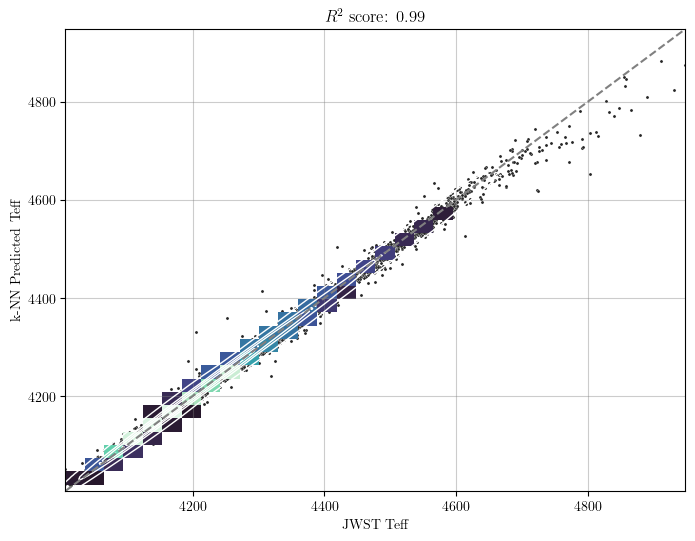

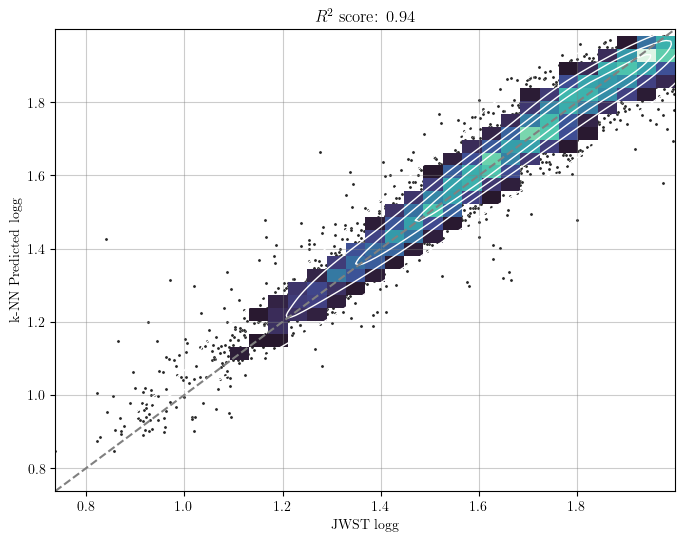

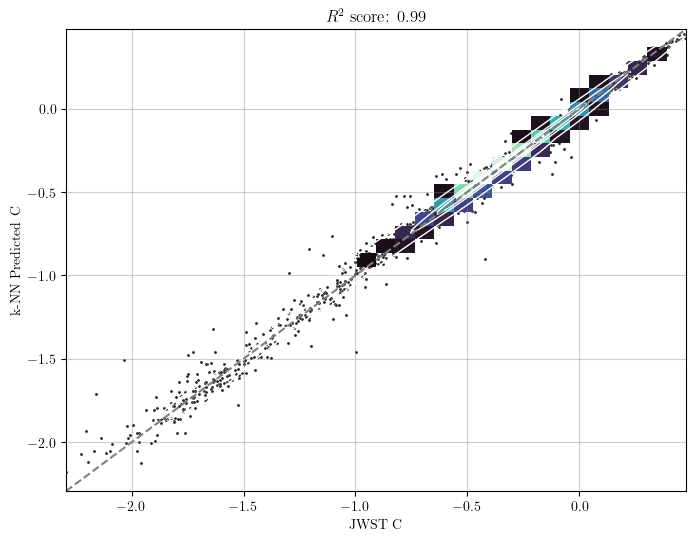

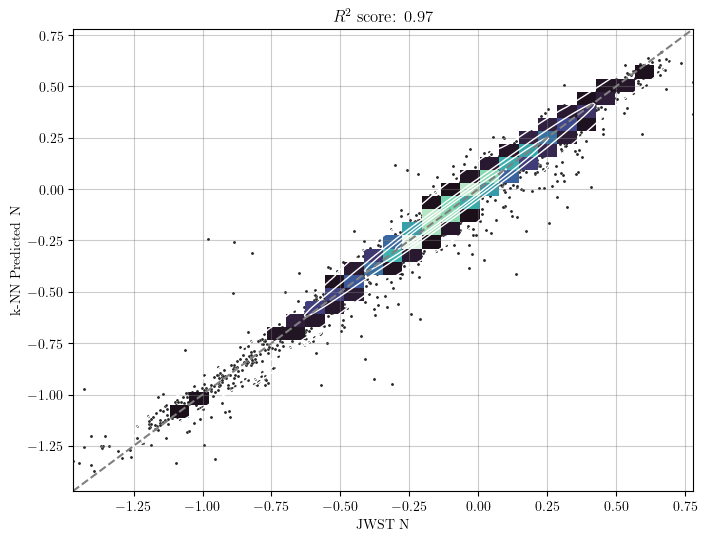

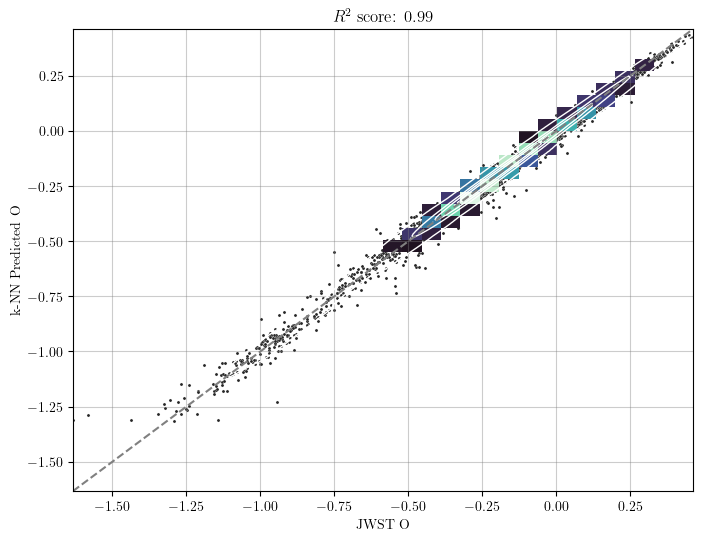

...

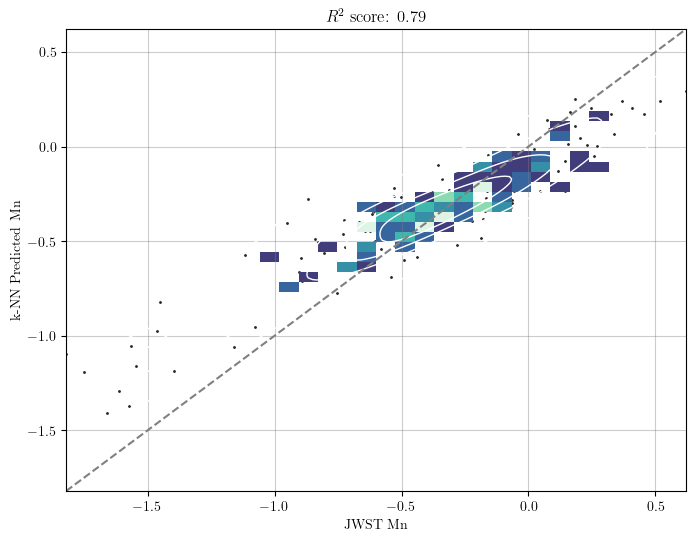

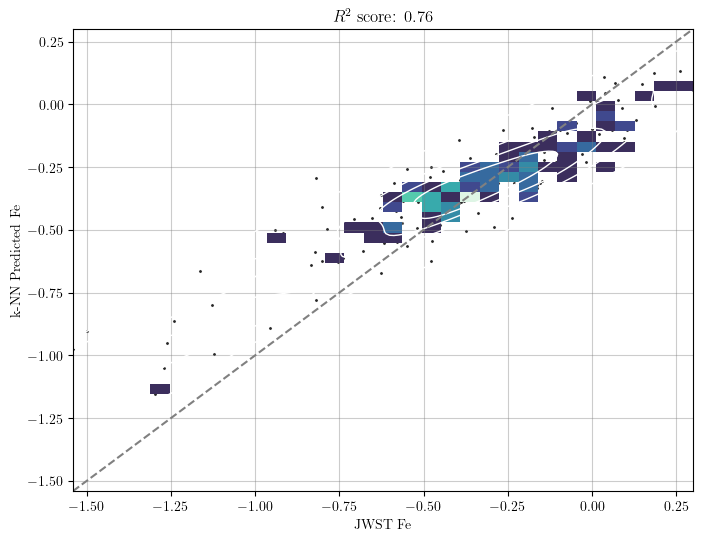

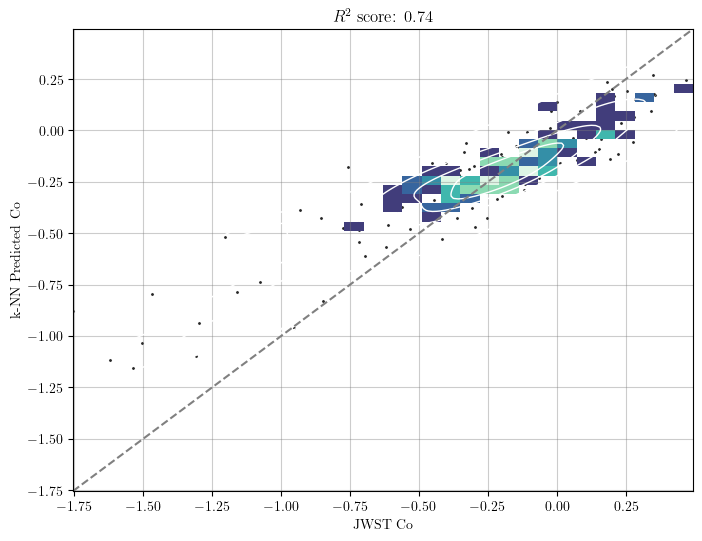

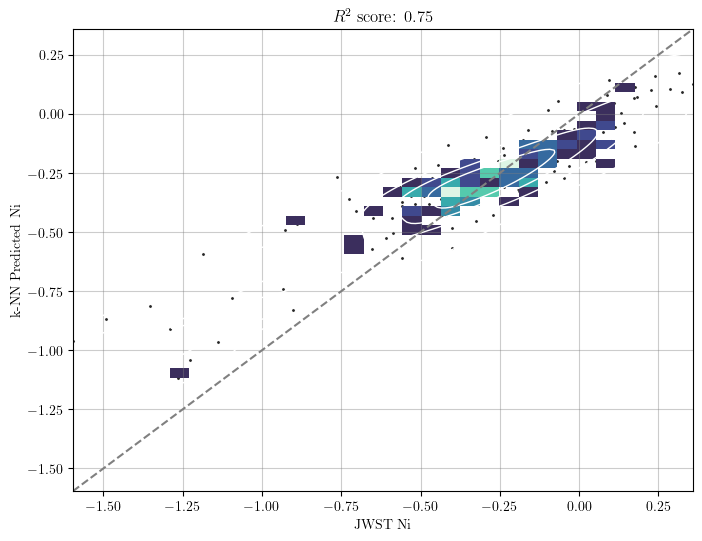

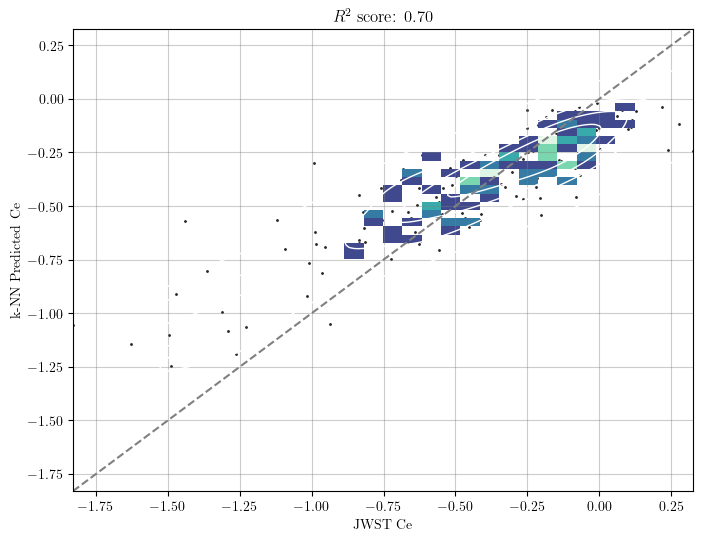

In [202]:
## Fit kNN ## 
def fit_kNN(jwst_labels, y_j_train_val, y_j_test, train_val_indices, test_indices, k_values, model_name, save_dir="FIGURES"):
    """
    Fits a k-Nearest Neighbors (kNN) regressor for each JWST label using corresponding k values 
    and plots the results. The model is fit using training + validation sets and evaluated on the test set.
    
    Parameters:
    jwst_labels (pd.DataFrame): DataFrame containing JWST labels.
    y_j_train_val (np.array): Array of training + validation set features.
    y_j_test (np.array): Array of test set features.
    train_val_indices (list or np.array): Indices of the training + validation set.
    test_indices (list or np.array): Indices of the test set.
    k_values (list of int): List of k values for each JWST label.
    model_name (str): Name of the model.
    save_dir (str): Directory to save the plots. Default is "FIGURES".
    
    Returns:
    R2_jwst (list): List of R^2 scores for each JWST label.
    """
    
    R2_jwst = []
    RMSE_jwst = []
    num_jwst_labels = len(jwst_labels.columns)
    
    for i in range(num_jwst_labels):
        label = jwst_labels.columns[i]
        
        # Set minimum and maximum values
        x_min = jwst_labels.iloc[test_indices][label].values.min()
        x_max = jwst_labels.iloc[test_indices][label].values.max()
        
        # Initialize kNN regressor with the corresponding k value for this label
        neigh = KNeighborsRegressor(weights='distance', n_neighbors=k_values[i])
        
        # Fit kNN on training + validation sets
        neigh.fit(y_j_train_val, jwst_labels.iloc[train_val_indices][label].values)
        
        # Predict on the full test set
        preds = neigh.predict(y_j_test)

        # Calculate RMSE
        rmse = np.sqrt(mean_squared_error(jwst_labels.iloc[test_indices][label].values, preds))
        RMSE_jwst.append(rmse)
        
        # Plot kNN regressor results
        plt.figure(figsize=(8, 6))
        sns.scatterplot(x=jwst_labels.iloc[test_indices][label].values, y=preds, s=5, color=".15")
        sns.histplot(x=np.clip(jwst_labels.iloc[test_indices][label].values, x_min, x_max), 
                     y=np.clip(preds, x_min, x_max), bins=32, pthresh=.1, cmap="mako")
        sns.kdeplot(x=jwst_labels.iloc[test_indices][label].values, y=preds, levels=5, color="w", linewidths=1)
        
        plt.xlabel(f'JWST {label}')
        plt.ylabel(f'k-NN Predicted {label}')
        plt.plot([x_min, x_max], [x_min, x_max], color='gray', ls='--')
        plt.xlim(x_min, x_max)
        plt.ylim(x_min, x_max)
        plt.title('$R^2$ score: %0.2f' % r2_score(jwst_labels.iloc[test_indices][label].values, preds), fontsize='large')
        
        # Save plot
        os.makedirs(save_dir, exist_ok=True)
        plt.savefig(os.path.join(save_dir, f'{model_name}_knn_by_{label}.png'))
        plt.show()
        plt.close()
        
        # Calculate and store R^2 score
        R2_jwst.append(r2_score(jwst_labels.iloc[test_indices][label].values, preds))
    
    return R2_jwst, RMSE_jwst 

# Example usage with full test set
R2_jwst, RMSE_jwst= fit_kNN(jwst_labels, y_j_train_val, y_j_test, train_val_indices, test_indices, best_k_values, "AstroCLIP", save_dir="FIGURES")
mock_R2_jwst, mock_RMSE_jwst = fit_kNN(jwst_labels_sample, y_mjs_train_val, y_mjs_test, mock_train_val_indices, mock_test_indices, mock_best_k_values, 
                       "MockAstroCLIP", save_dir="FIGURES") 

In [204]:
## Display R2, RMSE values ## 
metrics_df = pd.DataFrame({
    'R2': R2_jwst,
    'RMSE': RMSE_jwst
}, index=jwst_labels.columns).round(3)

metrics_df

,R2,RMSE
Teff,0.993,12.242
logg,0.941,0.059
C,0.991,0.037
N,0.971,0.057
O,0.990,0.026
Na,0.915,0.109
Mg,0.990,0.028
Al,0.977,0.049
Si,0.989,0.028
S,0.927,0.064


In [206]:
## Display R2, RMSE values ## 
mock_metrics_df = pd.DataFrame({
    'R2': mock_R2_jwst,
    'RMSE': mock_RMSE_jwst
}, index=jwst_labels.columns).round(3) 

mock_metrics_df

,R2,RMSE
Teff,0.758,78.032
logg,0.538,0.172
C,0.692,0.216
N,0.747,0.166
O,0.663,0.154
Na,0.707,0.202
Mg,0.648,0.164
Al,0.651,0.187
Si,0.686,0.149
S,0.606,0.152


### **6.5. Latent Space Visualisation** <a class="anchor" id="lat-space"></a>

#### **6.5.1. t-SNE** <a class="anchor" id="t-SNE"></a>

In [ ]:
def apply_and_plot_tsne(feature_sets, labels, test_indices, model_name, n_components=2, random_state=42, output_dir="FIGURES"):
    """
    Combines feature sets, applies t-SNE, and plots the results.

    Parameters:
    - feature_sets (list): A list of feature arrays or DataFrames to concatenate.
    - labels (pd.DataFrame): DataFrame containing the labels for coloring the t-SNE plot.
    - test_indices (list or array): Indices for selecting the test set labels.
    - model_name (str): Name of model. 
    - n_components (int): Number of t-SNE components. Default is 2.
    - random_state (int): Random seed for t-SNE. Default is 42.
    - output_dir (str): Directory to save the output plots. Default is "FIGURES".
    """
    # Combine features
    combined_features = pd.concat([pd.DataFrame(f) for f in feature_sets], axis=1)

    # Apply t-SNE
    tsne = TSNE(n_components=n_components, random_state=random_state)
    tsne_results = tsne.fit_transform(combined_features)

    # Plot results
    for i in range(len(labels.columns)):
        plt.figure()  
        plt.scatter(tsne_results[:, 0], tsne_results[:, 1], 
                    c=labels.iloc[test_indices][labels.columns[i]].values)
        cbar = plt.colorbar()
        cbar.set_label(label=labels.columns[i], size=25)
        cbar.ax.tick_params(labelsize=22)
        plt.xlabel("t-SNE Component 1", fontsize=25)
        plt.ylabel("t-SNE Component 2", fontsize=25)

        plt.grid(False)
        plt.tight_layout()

        # Save plot
        if not os.path.exists(output_dir):
            os.makedirs(output_dir)
        plt.savefig(os.path.join(output_dir, f"{model_name}_tsne_by_{labels.columns[i]}.png"))
        plt.show()
        plt.close()

apply_and_plot_tsne([y_j_test, y_a_test], jwst_labels, test_indices, "AstroCLIP")
apply_and_plot_tsne([y_js_test, y_mjs_test], jwst_labels_sample, mock_test_indices, "MockAstroCLIP") 

#### **6.5.2. u-MAP** <a class="anchor" id="u-MAP"></a>

In [ ]:
def apply_and_plot_umap(feature_sets, labels, test_indices, model_name, n_neighbors=15, min_dist=0.1, 
                        n_components=2, random_state=None, output_dir="FIGURES"):
    """
    Combines feature sets, applies UMAP, and plots the results.

    Parameters:
    - feature_sets (list): A list of feature arrays or DataFrames to concatenate.
    - labels (pd.DataFrame): DataFrame containing the labels for coloring the UMAP plot.
    - test_indices (list or array): Indices for selecting the test set labels.
    - model_name (str): Name of model.
    - n_neighbors (int): Number of neighbors to consider in UMAP. Default is 15.
    - min_dist (float): Minimum distance between points in UMAP. Default is 0.1.
    - n_components (int): Number of UMAP components. Default is 2.
    - random_state (int): Random seed for UMAP. Use None for no seed. Default is None.
    - output_dir (str): Directory to save the output plots. Default is "FIGURES".
    """
    # Combine features
    combined_features = pd.concat([pd.DataFrame(f) for f in feature_sets], axis=1)

    # Apply UMAP
    reducer = umap.UMAP(n_neighbors=n_neighbors, min_dist=min_dist, 
                        n_components=n_components, random_state=random_state)
    umap_results = reducer.fit_transform(combined_features)

    # Plot results
    for i in range(len(labels.columns)):
        plt.figure()
        plt.scatter(umap_results[:, 0], umap_results[:, 1], 
                    c=labels.iloc[test_indices][labels.columns[i]].values)
        cbar = plt.colorbar()
        cbar.set_label(label=labels.columns[i], size=25)
        cbar.ax.tick_params(labelsize=22)
        plt.xlabel("UMAP Component 1", fontsize=25)
        plt.ylabel("UMAP Component 2", fontsize=25)

        plt.grid(False)
        plt.tight_layout()

        # Save plot
        if not os.path.exists(output_dir):
            os.makedirs(output_dir)
        plt.savefig(os.path.join(output_dir, f"{model_name}_umap_by_{labels.columns[i]}.png"))
        plt.show()
        plt.close()

apply_and_plot_umap([y_j_test, y_a_test], jwst_labels, test_indices, "AstroCLIP")
apply_and_plot_umap([y_js_test, y_mjs_test], jwst_labels_sample, mock_test_indices, "MockAstroCLIP")

#### **6.6.3. PCA** <a class="anchor" id="PCA"></a>
Using Principal Component Analysis, we extract the main axes of variations of the embedded data, and plot a subsample of the embeddings in the principal dimensions.

In [ ]:
def extract_and_plot_pca(feature_sets, labels, test_indices, model_names, label_index, n_components=4, output_dir="FIGURES"):
    """
    Extracts PCA components from feature sets and plots the results.

    Parameters:
    - feature_sets (list): A list of feature arrays or DataFrames for PCA extraction.
    - labels (pd.DataFrame): DataFrame containing the labels for coloring the PCA plots.
    - test_indices (list or array): Indices for selecting the test set labels.
    - model_names (list): List of names corresponding to each feature set for labeling plots.
    - label_index (int): Index from 0 to 19 denoting one of the twenty stellar labels. 
    - n_components (int): Number of PCA components to extract. Default is 4.
    - output_dir (str): Directory to save the output plots. Default is "FIGURES".
    """
    pca_results = []
    
    # Extract PCA components
    for features in feature_sets:
        pca = PCA(n_components=n_components)
        pca_result = pca.fit_transform(features / np.linalg.norm(features, axis=-1, keepdims=True))
        pca_results.append(pca_result)

    # Visualize PCA results    
    plt.figure(figsize=(12, 6))
    
    for i, (pca_result, model_name) in enumerate(zip(pca_results, model_names)):
        plt.subplot(1, len(pca_results), i + 1)
        if i == 0:
            plt.scatter(pca_result[:, 0], pca_result[:, 1], c=labels.iloc[test_indices][labels.columns[label_index]].values,
                        cmap='mako', s=20, alpha=0.5)
        else:
            plt.scatter(pca_result[:, 0], pca_result[:, 1], c=labels.iloc[test_indices][labels.columns[label_index]].values,
                       cmap='mako', s=20, alpha=0.5)
            cbar = plt.colorbar()
            cbar.set_label(label=labels.columns[label_index], size=25)
            cbar.ax.tick_params(labelsize=25)
        
        plt.title(f'{model_name} PCA')
        plt.xlabel('PC 1', fontsize=25)
        plt.ylabel('PC 2', fontsize=25)
        plt.xticks(fontsize=25)
        plt.yticks(fontsize=25)
        plt.grid(False)
    
    plt.tight_layout()
    plt.savefig(os.path.join(output_dir, f"PCA_{model_names[0]}.png"))
    plt.show()
    plt.close()

In [ ]:
for i in range(num_jwst_labels):
    extract_and_plot_pca([y_j_test, y_a_test], jwst_labels, test_indices, ["JWST", "APOGEE"], i)

In [ ]:
for i in range(num_jwst_labels):
    extract_and_plot_pca([y_js_test, y_mjs_test], jwst_labels_sample, mock_test_indices, ["SAMPLE JWST", "MOCK JWST"], i)

## **7. Appendix** <a class="anchor" id="appendix"></a>
OLD VERSION OF NOTEBOOK AVAILABLE IN `/SCRATCH/OLD_NOTEBOOKS`:
- `ConsLearnsNet.ipynb`
- `ConsLearnsNet_CV_copy.ipynb`

## **8. References** <a class="anchor" id="refs"></a>

**Literature** 
Parker, L., Lanusse, F., Golkar, S., Sarra, L., Cranmer, M., Bietti, A., Eickenberg, M., Krawezik, G., McCabe, M., Morel, R., Ohana, R., Pettee, M., Régaldo-Saint Blancard, B., Cho, K., & Ho, S. (2024). "AstroCLIP: A cross-modal foundation model for galaxies." *Monthly Notices of the Royal Astronomical Society*, 531(4), 4990–5011. https://doi.org/10.1093/mnras/stae1450 

**Code** 
https://github.com/PolymathicAI/AstroCLIP/blob/neurips23/notebooks/tutorial/AstroCLIPTutorial.ipynb 

## **9. Misc. Code** <a class="anchor" id="misc-code"></a>

In [ ]:
def get_CSS_df(jwst_sim, apogee_sim, cross_jwst_apogee_sim, cross_apogee_jwst_sim, jwst_features_normed, apogee_features_normed, ind_query):
    """Computes index of the queried object in sorted list of similar objects. Calculates
    cosine similarity between the queried object and most similar object based on specified similarity type.

    Parameters:
    - jwst_sim (np.ndarray): Array of similarity scores for JWST objects.
    - apogee_sim (np.ndarray): Array of similarity scores for APOGEE objects.
    - cross_jwst_apogee_sim (np.ndarray): Array of cross-similarity scores between JWST and APOGEE objects.
    - cross_apogee_jwst_sim (np.ndarray): Array of cross-similarity scores between APOGEE and JWST objects.
    - jwst_features_normed (np.ndarray): Array of normalized JWST features.
    - apogee_features_normed (np.ndarray): Array of normalized APOGEE features.
    - ind_query (int): Index of the queried object.

    Returns:
    pd.DataFrame: DataFrame with the index of the queried object in sorted lists and cosine similarity to the most similar object.
    """
    def get_sorted_index_and_cosine(similarity_scores, features_normed1, features_normed2):
        """Helper function to get sorted index and cosine similarity."""
        sorted_indices = np.argsort(similarity_scores)[::-1]
        ind_query_list = np.where(sorted_indices == ind_query)[0][0]
        cosine_similarity = features_normed1[ind_query] @ features_normed2[sorted_indices[0]]
        return ind_query_list, cosine_similarity

    # Compute sorted indices and cosine similarities
    ind_query_list_jwst, cosine_jwst = get_sorted_index_and_cosine(jwst_sim, jwst_features_normed, jwst_features_normed)
    ind_query_list_apogee, cosine_apogee = get_sorted_index_and_cosine(apogee_sim, apogee_features_normed, apogee_features_normed)
    ind_query_list_cross_jwst_apogee, cosine_cross_jwst_apogee = get_sorted_index_and_cosine(cross_jwst_apogee_sim, jwst_features_normed, apogee_features_normed)
    ind_query_list_cross_apogee_jwst, cosine_cross_apogee_jwst = get_sorted_index_and_cosine(cross_apogee_jwst_sim, apogee_features_normed, jwst_features_normed)

    # Prepare the results DataFrame
    df = pd.DataFrame({
        'Metric': ['JWST', 'APOGEE', 'Cross JWST-APOGEE', 'Cross APOGEE-JWST'],
        'Index': [ind_query_list_jwst, ind_query_list_apogee, ind_query_list_cross_jwst_apogee, ind_query_list_cross_apogee_jwst],
        'Cosine': [cosine_jwst, cosine_apogee, cosine_cross_jwst_apogee, cosine_cross_apogee_jwst] 
    })

    return df

In [ ]:
## Define a function to plot top 4 CSS-retrieved plots ## 
def plot_top4_CSS(sim_metric, spectra1, spectra2, jwst_queried=True):
    """
    Plots the spectra of the top 4 most similar objects based on the similarity metric,
    along with the queried spectrum and the residuals. 

    Parameters:
    - sim_metric (np.ndarray): Array of similarity scores for the spectra.
    - spectra1 (pd.DataFrame): DataFrame containing spectra of the first type.
    - spectra2 (pd.DataFrame): DataFrame containing spectra of the second type.
    - jwst_queried (bool): If True, the queried spectrum is from JWST; if False, it is from APOGEE or Mock JWST. Default is True.
    """
    # Sort indices based on sim_metric in descending order
    sorted_indices = np.argsort(sim_metric)[::-1]

    # Loop through top 4 results
    for i in range(4):
        plt.figure(figsize=[15, 4])
        
        plt.subplot(131)
        plt.plot(features1.iloc[sorted_indices[i]], color='grey', alpha=0.5, label="Spectrum of retrieved object")
        plt.grid(False)
        if jwst_queried:
            plt.plot(features1.iloc[ind_query], color='blue', alpha=0.5, label='Spectrum of queried object')
            plt.legend()
        if i == 0:
            plt.title('Spectrum 1')
        
        # Plot APOGEE spectra
        plt.subplot(132)
        plt.plot(features2.iloc[sorted_indices[i]], color='grey', alpha=0.5, label='Spectrum of retrieved object')
        plt.grid(False)
        if not jwst_queried:
            plt.plot(features2.iloc[ind_query], color='red', alpha=0.5, label='Spectrum of queried object')
            plt.legend()
        if i == 0:
            plt.title('Spectrum 2')
        
        # Plot residuals
        plt.subplot(133)
        if jwst_queried:
            plt.plot(features1.iloc[ind_query] - features2.iloc[sorted_indices[i]], color='grey', alpha=0.5)
        else:
            plt.plot(features1.iloc[ind_query] - features2.iloc[sorted_indices[i]], color='grey', alpha=0.5)
        plt.title('Residuals')